# WELCOME!

Welcome to the "***Sentiment Analysis and Classification Project***" project, the first and only project of the ***Natural Language Processing (NLP)*** course.

This analysis will focus on using Natural Language techniques to find broad trends in the written thoughts of the customers. 
The goal in this project is to predict whether customers recommend the product they purchased using the information in their review text.

One of the challenges in this project is to extract useful information from the *Review Text* variable using text mining techniques. The other challenge is that you need to convert text files into numeric feature vectors to run machine learning algorithms.

At the end of this project, you will learn how to build sentiment classification models using Machine Learning algorithms (***Logistic Regression, Naive Bayes, Support Vector Machine, Random Forest*** and ***Ada Boosting***), **Deep Learning algorithms** and **BERT algorithm**.

Before diving into the project, please take a look at the Determines and Tasks.

- ***NOTE:*** *This tutorial assumes that you already know the basics of coding in Python and are familiar with the theory behind the algorithms mentioned above as well as NLP techniques.*



---
---


# #Determines
The data is a collection of 22641 Rows and 10 column variables. Each row includes a written comment as well as additional customer information. 
Also each row corresponds to a customer review, and includes the variables:


**Feature Information:**

**Clothing ID:** Integer Categorical variable that refers to the specific piece being reviewed.

**Age:** Positive Integer variable of the reviewers age.

**Title:** String variable for the title of the review.

**Review Text:** String variable for the review body.

**Rating:** Positive Ordinal Integer variable for the product score granted by the customer from 1 Worst, to 5 Best.

**Recommended IND:** Binary variable stating where the customer recommends the product where 1 is recommended, 0 is not recommended.

**Positive Feedback Count:** Positive Integer documenting the number of other customers who found this review positive.

**Division Name:** Categorical name of the product high level division.

**Department Name:** Categorical name of the product department name.

**Class Name:** Categorical name of the product class name.

---

The basic goal in this project is to predict whether customers recommend the product they purchased using the information in their *Review Text*.
Especially, it should be noted that the expectation in this project is to use only the "Review Text" variable and neglect the other ones. 
Of course, if you want, you can work on other variables individually.

Project Structure is separated in five tasks: ***EDA, Feature Selection and Data Cleaning , Text Mining, Word Cloud*** and ***Sentiment Classification with Machine Learning, Deep Learning and BERT model***.

Classically, you can start to know the data after doing the import and load operations. 
You need to do missing value detection for Review Text, which is the only variable you need to care about. You can drop other variables.

You will need to apply ***noise removal*** and ***lexicon normalization*** processes by using the capabilities of the ***nltk*** library to the data set that is ready for text mining.

Afterwards, you will implement ***Word Cloud*** as a visual analysis of word repetition.

Finally, You will build models with five different algorithms and compare their performance. Thus, you will determine the algorithm that makes the most accurate emotion estimation by using the information obtained from the * Review Text * variable.






---
---


# #Tasks

#### 1. Exploratory Data Analysis

- Import Modules, Load Discover the Data

#### 2. Feature Selection and Data Cleaning

- Feature Selection and Rename Column Name
- Missing Value Detection

#### 3. Text Mining

- Tokenization
- Noise Removal
- Lexicon Normalization

#### 4. WordCloud - Repetition of Words

- Detect Reviews
- Collect Words 
- Create Word Cloud 


#### 5. Sentiment Classification with Machine Learning, Deep Learning and BERT Model

- Train - Test Split
- Vectorization
- TF-IDF
- Logistic Regression
- Naive Bayes
- Support Vector Machine
- Random Forest
- AdaBoost
- Deep Learning Model
- BERT Model
- Model Comparison

---
---


# Sentiment analysis of women's clothes reviews


In this project we used sentiment analysis to determined whether the product is recommended or not. We used different machine learning algorithms to get more accurate predictions. The following classification algorithms have been used: ML algorithms(Logistic Regression, Naive Bayes, Support Vector Machine (SVM), Random Forest and Ada Boosting), Deep learning algorithm and BERT algorithm. The dataset comes from Woman Clothing Review that can be find at (https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews. 


In [27]:
## setup and restart
# !pip install matplotlib==3.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
!pip install scikit-plot -q

## 1. Exploratory Data Analysis

### Import Libraries, Load and Discover the Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import gdown
# same as the above, but with the file ID
id = "17YTKGaSbl8KyAu-OENrDnWBVcUYDY_EQ" # id: Womens Clothin...csv
output = '/content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv' # download colab
gdown.download(id=id, output=output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=17YTKGaSbl8KyAu-OENrDnWBVcUYDY_EQ
To: /content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv
100%|██████████| 8.48M/8.48M [00:00<00:00, 216MB/s]


'/content/drive/MyDrive/Colab Notebooks/Womens Clothing E-Commerce Reviews.csv'

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from matplotlib.image import imread

import warnings
warnings.filterwarnings("ignore")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

## Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

In [15]:
# import tensorflow as tf
# tf.config.list_physical_devices("GPU")

### Data Wrangling

In [5]:
df_org = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/NLP_Project/Womens Clothing E-Commerce Reviews.csv")
df_org.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [6]:
df_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Unnamed: 0               23486 non-null  int64 
 1   Clothing ID              23486 non-null  int64 
 2   Age                      23486 non-null  int64 
 3   Title                    19676 non-null  object
 4   Review Text              22641 non-null  object
 5   Rating                   23486 non-null  int64 
 6   Recommended IND          23486 non-null  int64 
 7   Positive Feedback Count  23486 non-null  int64 
 8   Division Name            23472 non-null  object
 9   Department Name          23472 non-null  object
 10  Class Name               23472 non-null  object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


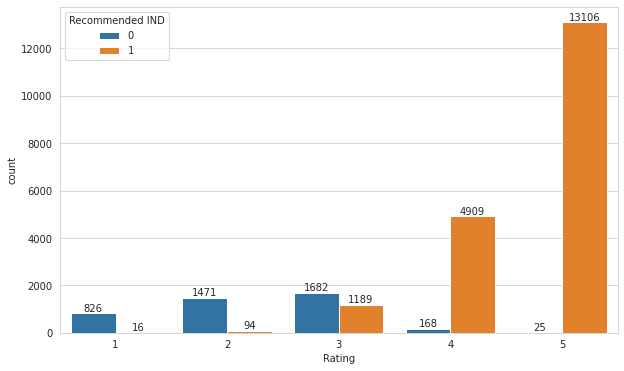

In [7]:
ax = sns.countplot(data=df_org, x="Rating", hue = "Recommended IND")
for p in ax.containers:
    ax.bar_label(p)

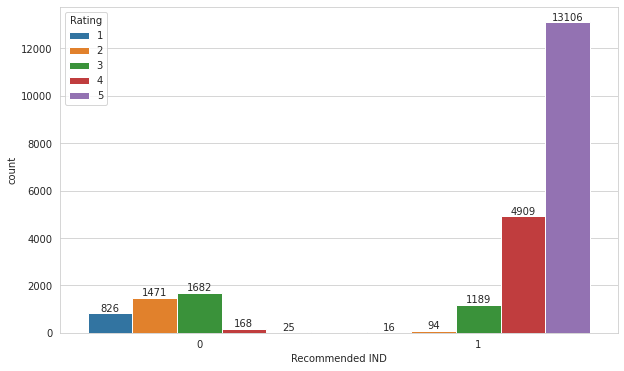

In [8]:
ax = sns.countplot(data=df_org, hue="Rating", x = "Recommended IND")
for p in ax.containers:
    ax.bar_label(p)

In [ ]:
# df_org["Positive Feedback Count"].value_counts(dropna=False)

In [ ]:
# df_org["Title"].value_counts(dropna=False)

In [ ]:
# df_org["Title"].nunique()

In [9]:
df_org["Division Name"].value_counts()

General           13850
General Petite     8120
Initmates          1502
Name: Division Name, dtype: int64

In [ ]:
ax = sns.countplot(data=df_org, x="Division Name", hue = "Recommended IND")
for p in ax.containers:
    ax.bar_label(p)

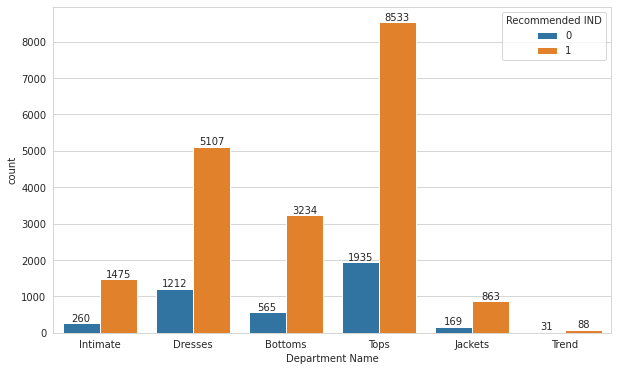

In [11]:
ax = sns.countplot(data=df_org, x="Department Name", hue = "Recommended IND")
for p in ax.containers:
    ax.bar_label(p)

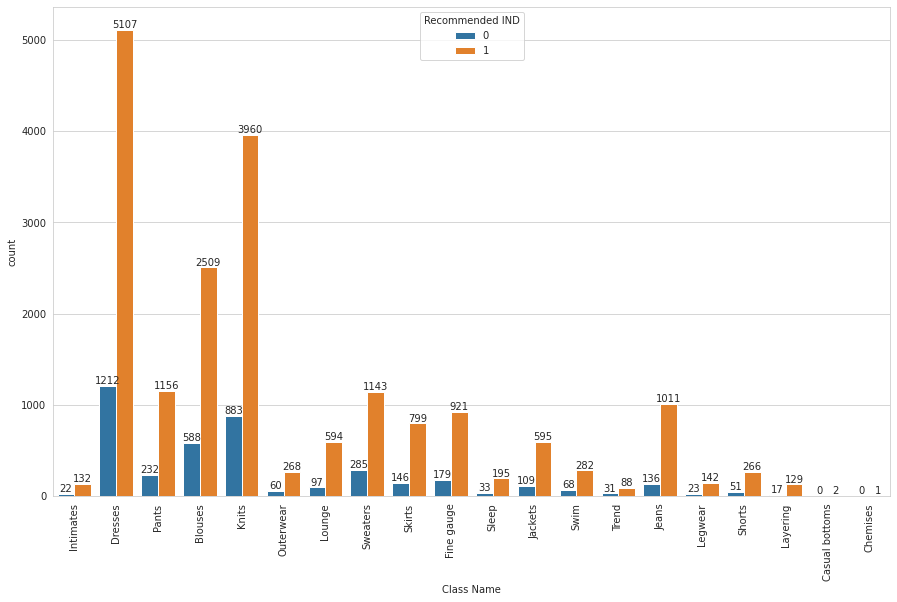

In [12]:
plt.figure(figsize=(15,9))
ax = sns.countplot(data=df_org, x="Class Name", hue = "Recommended IND")
for p in ax.containers:
    ax.bar_label(p)
plt.xticks(rotation =90);

#### Check Proportion of Target Class Variable:

The target class variable is imbalanced, where "Recommended" values are more dominating then "Not Recommendation".

In [13]:
df_org["Recommended IND"].value_counts()  # 1 is recommended, 0 is not recommended.

1    19314
0     4172
Name: Recommended IND, dtype: int64

In [15]:
df_org["Recommended IND"].value_counts(normalize=True) 

1   0.822
0   0.178
Name: Recommended IND, dtype: float64

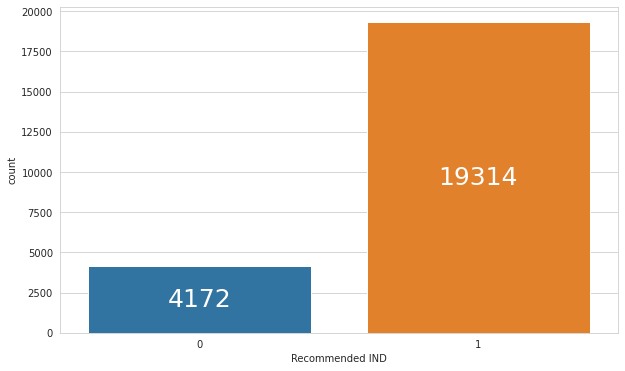

In [16]:
ax = sns.countplot(data =df_org, x = "Recommended IND")
ax.bar_label(ax.containers[0], label_type="center",color='white',fontsize=25 );

In [17]:
# ax = sns.countplot(data =df_org, x = "Recommended IND")
# ax.bar_label(ax.containers[0], padding=-30, fontsize=20, weight='bold', color='w');

## 2. Feature Selection and Data Cleaning

From now on, the DataFrame you will work with should contain two columns: **"Review Text"** and **"Recommended IND"**. You can do the missing value detection operations from now on. You can also rename the column names if you want.



### Feature Selection and Rename Column Name

In [18]:
df = df_org.copy()

In [19]:
df =df[["Recommended IND","Review Text"]]
df.rename(columns={"Review Text":"text", "Recommended IND":"label"}, inplace=True)
df['label'] = df['label'].map({0 : 1, 1: 0})
df.head()

,label,text
0,0,Absolutely wonderful - silky and sexy and comf...
1,0,Love this dress! it's sooo pretty. i happene...
2,1,I had such high hopes for this dress and reall...
3,0,"I love, love, love this jumpsuit. it's fun, fl..."
4,0,This shirt is very flattering to all due to th...


In [20]:
df.label.value_counts(normalize=True)

0   0.822
1   0.178
Name: label, dtype: float64

---
---


### Missing Value Detection

In [21]:
df.isnull().sum()
## or it can be used following code:
df.isna().sum()

label      0
text     845
dtype: int64

In [22]:
df = df.dropna().reset_index(drop=True)
df

,label,text
0,0,Absolutely wonderful - silky and sexy and comf...
1,0,Love this dress! it's sooo pretty. i happene...
2,1,I had such high hopes for this dress and reall...
3,0,"I love, love, love this jumpsuit. it's fun, fl..."
4,0,This shirt is very flattering to all due to th...
...,...,...
22636,0,I was very happy to snag this dress at such a ...
22637,0,"It reminds me of maternity clothes. soft, stre..."
22638,1,"This fit well, but the top was very see throug..."
22639,0,I bought this dress for a wedding i have this ...


In [23]:
df.duplicated().sum()

7

---
---


## 3. Text Mining

Text is the most unstructured form of all the available data, therefore various types of noise are present in it. This means that the data is not readily analyzable without any pre-processing. The entire process of cleaning and standardization of text, making it noise-free and ready for analysis is known as **text preprocessing**.

The three key steps of text preprocessing:

- **Tokenization:**
This step is one of the top priorities when it comes to working on text mining. Tokenization is essentially splitting a phrase, sentence, paragraph, or an entire text document into smaller units, such as individual words or terms. Each of these smaller units are called tokens.

- **Noise Removal:**
Any piece of text which is not relevant to the context of the data and the end-output can be specified as the noise.
For example – language stopwords (commonly used words of a language – is, am, the, of, in etc), URLs or links, upper and lower case differentiation, punctuations and industry specific words. This step deals with removal of all types of noisy entities present in the text.


- **Lexicon Normalization:**
Another type of textual noise is about the multiple representations exhibited by single word.
For example – “play”, “player”, “played”, “plays” and “playing” are the different variations of the word – “play”. Though they mean different things, contextually they all are similar. This step converts all the disparities of a word into their normalized form (also known as lemma). 
There are two methods of lexicon normalisation; **[Stemming or Lemmatization](https://www.guru99.com/stemming-lemmatization-python-nltk.html)**. Lemmatization is recommended for this case, because Lemmatization as this will return the root form of each word (rather than just stripping suffixes, which is stemming).

As the first step change text to tokens and convertion all of the words to lower case.  Next remove punctuation, bad characters, numbers and stop words. The second step is aimed to normalization them throught the Lemmatization method. 


***Note:*** *Use the functions of the ***[nltk Library](https://www.guru99.com/nltk-tutorial.html)*** for all the above operations.*



### Tokenization, Noise Removal, Lexicon Normalization

In [24]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from collections import Counter

In [25]:
nltk.download("punkt")
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [28]:
# np.unique([word for word in ' '.join(df['text'].values) if not word.isalpha()])

In [29]:
stop_words = stopwords.words('english')
for i in ["not", "no"]:
        stop_words.remove(i)

In [30]:
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'nor', 'only', 'own', 'same', 'so', 'than', 'too', 'very',

In [31]:
def cleaning(data):
    
    #1. Tokenize
    text_tokens = word_tokenize(data.replace("'", "").lower())  # replace("'", ""): Removing upper brackets to keep negative auxiliary verbs in text
    
    #2. Remove Puncs and numbers
    tokens_without_punc = [w for w in text_tokens if w.isalpha()]
    
    #3. Removing Stopwords
    tokens_without_sw = [t for t in tokens_without_punc if t not in stop_words]
    
    #4. lemma
    text_cleaned = [WordNetLemmatizer().lemmatize(t) for t in tokens_without_sw]
    
    #5.joining
    return " ".join(text_cleaned)

In [32]:
df["text"].values

array(['Absolutely wonderful - silky and sexy and comfortable',
       'Love this dress!  it\'s sooo pretty.  i happened to find it in a store, and i\'m glad i did bc i never would have ordered it online bc it\'s petite.  i bought a petite and am 5\'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.',
       'I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c',
       ...,
       "This fit well, but the top was very see through. this never would have worked for me. i

In [33]:
df["text"] = df["text"].apply(cleaning)
df["text"].head()

0          absolutely wonderful silky sexy comfortable
1    love dress sooo pretty happened find store im ...
2    high hope dress really wanted work initially o...
3    love love love jumpsuit fun flirty fabulous ev...
4    shirt flattering due adjustable front tie perf...
Name: text, dtype: object

## 4. WordCloud - Repetition of Words

Now you'll create a Word Clouds for reviews, representing most common words in each target class.

Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.

You are expected to create separate word clouds for positive and negative reviews. You can qualify a review as positive or negative, by looking at its recommended status. You may need to use capabilities of matplotlib for visualizations.

You can follow the steps below:

- Detect Reviews
- Collect Words 
- Create Word Cloud 


### Detect Reviews (positive and negative separately)

In [34]:
positive_reviews = df[df["label"] == 1]["text"]  # 0 is recommended and 1 is not recommended.
positive_reviews

2        high hope dress really wanted work initially o...
5        love tracy reese dress one not petite foot tal...
10       dress run small esp zipper area run ordered sp...
22       first not pullover styling side zipper wouldnt...
25       loved material didnt really look long dress pu...
                               ...                        
22606    tried color really pretty fun donset want pair...
22607    wanted love jacket soft great color unfortunat...
22617    purchased good price typically love maeve fabr...
22634    surprised positive review product terrible cut...
22638    fit well top see never would worked im glad ab...
Name: text, Length: 4101, dtype: object

In [35]:
# positive_reviews.iloc[5]

In [36]:
negative_reviews = df[df["label"] == 0]["text"]
negative_reviews

0              absolutely wonderful silky sexy comfortable
1        love dress sooo pretty happened find store im ...
3        love love love jumpsuit fun flirty fabulous ev...
4        shirt flattering due adjustable front tie perf...
6        aded basket hte last mintue see would look lik...
                               ...                        
22635    wasnt sure ordering skirt couldnt see person f...
22636    happy snag dress great price easy slip flatter...
22637    reminds maternity clothes soft stretchy shiny ...
22639    bought dress wedding summer cute unfortunately...
22640    dress lovely platinum feminine fit perfectly e...
Name: text, Length: 18540, dtype: object

In [37]:
# negative_reviews.iloc[5]

### Collect Words (positive and negative separately)

#### All words

In [38]:
all_words = " ".join(df["text"])
all_words

'absolutely wonderful silky sexy comfortable love dress sooo pretty happened find store im glad bc never would ordered online bc petite bought petite love length hit little knee would definitely true midi someone truly petite high hope dress really wanted work initially ordered petite small usual size found outrageously small small fact could not zip reordered petite medium overall top half comfortable fit nicely bottom half tight layer several somewhat cheap net layer imo major design flaw net layer sewn directly zipper c love love love jumpsuit fun flirty fabulous every time wear get nothing great compliment shirt flattering due adjustable front tie perfect length wear legging sleeveless pair well cardigan love shirt love tracy reese dress one not petite foot tall usually wear brand dress pretty package lot dress skirt long full overwhelmed small frame not stranger alteration shortening narrowing skirt would take away embellishment garment love color idea style not work returned dres

#### Positive words

In [39]:
positive_reviews_words = " ".join(positive_reviews)
positive_reviews_words

'high hope dress really wanted work initially ordered petite small usual size found outrageously small small fact could not zip reordered petite medium overall top half comfortable fit nicely bottom half tight layer several somewhat cheap net layer imo major design flaw net layer sewn directly zipper c love tracy reese dress one not petite foot tall usually wear brand dress pretty package lot dress skirt long full overwhelmed small frame not stranger alteration shortening narrowing skirt would take away embellishment garment love color idea style not work returned dress dress run small esp zipper area run ordered sp typically fit tight material top look feel cheap even pulling cause rip fabric pretty disappointed going christmas dress year needle say going back first not pullover styling side zipper wouldnt purchased knew side zipper large bust side zipper next impossible second tulle feel look cheap slip awkward tight shape underneath not look like described sadly returning im sure fi

In [40]:
# positive_frequency = pd.Series(positive_reviews_words.split(" ")).value_counts().sort_values(ascending=False)
# positive_frequency_top = " ".join(positive_frequency.head(250).index)
# positive_frequency_top

In [41]:
positive_frequency = pd.Series(positive_reviews_words.split(" ")).value_counts().sort_values(ascending=False)
positive_frequency

not           2522
dress         2103
like          1746
top           1697
look          1582
              ... 
ballooning       1
stadium          1
pillow           1
ope              1
bridal           1
Length: 5901, dtype: int64

#### Negative words

In [42]:

negative_reviews_words = " ".join(negative_reviews)
negative_reviews_words

'absolutely wonderful silky sexy comfortable love dress sooo pretty happened find store im glad bc never would ordered online bc petite bought petite love length hit little knee would definitely true midi someone truly petite love love love jumpsuit fun flirty fabulous every time wear get nothing great compliment shirt flattering due adjustable front tie perfect length wear legging sleeveless pair well cardigan love shirt aded basket hte last mintue see would look like person store pick went teh darkler color pale hte color really gorgeous turn mathced everythiing trying prefectly little baggy hte x hte msallet size bummer no petite decided jkeep though said matvehd everything ejans pant skirt waas trying kept oops ordered carbon store pick ton stuff always try used top pair skirt pant everything went color really nice charcoal shimmer went well pencil skirt flare pant etc compaint bit big sleeve long doesnt go petite also bit loose no xx kept wil ldecide later since light color alread

In [43]:
# negative_frequency = pd.Series(negative_reviews_words.split(" ")).value_counts().sort_values(ascending=False)
# negative_frequency_top = " ".join(negative_frequency.head(250).index)
# negative_frequency_top

In [44]:
negative_frequency = pd.Series(negative_reviews_words.split(" ")).value_counts().sort_values(ascending=True)
negative_frequency

platinum       1
askedher       1
donest         1
nonte          1
locally        1
            ... 
not         7429
size        8020
love        8062
fit         8638
dress       9249
Length: 10763, dtype: int64

### Create Word Cloud (for most common words in recommended not recommended reviews separately)

In [45]:
from wordcloud import WordCloud
from PIL import Image

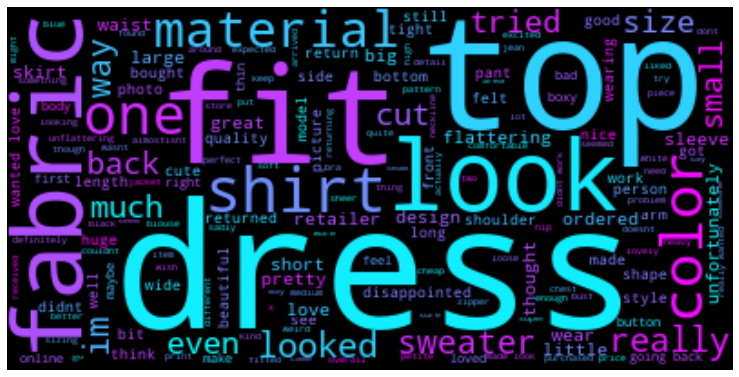

In [46]:
worldcloud = WordCloud(background_color="black", max_words =250, colormap="cool")
worldcloud.generate(positive_reviews_words)

plt.figure(figsize = (13,13))
plt.imshow(worldcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [47]:
# worldcloud.words_

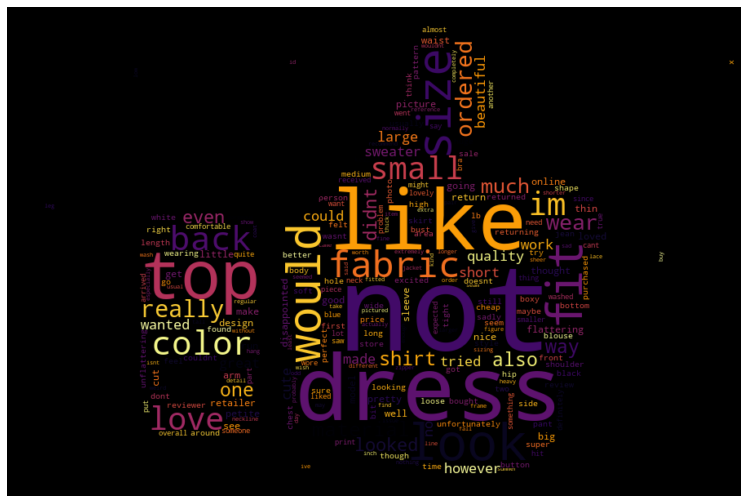

In [48]:
mask = np.array(Image.open("/content/drive/MyDrive/Colab Notebooks/NLP_Project/zzz.jpg"))

# Generate wordcloud
wordcloud = WordCloud(background_color="black", colormap=plt.cm.inferno, max_words =250, stopwords=stop_words, 
  width=1600, height=900, collocations=False, mask=mask, contour_width=2).generate(positive_reviews_words)
  
# Plot
plt.figure(figsize = (16,9))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

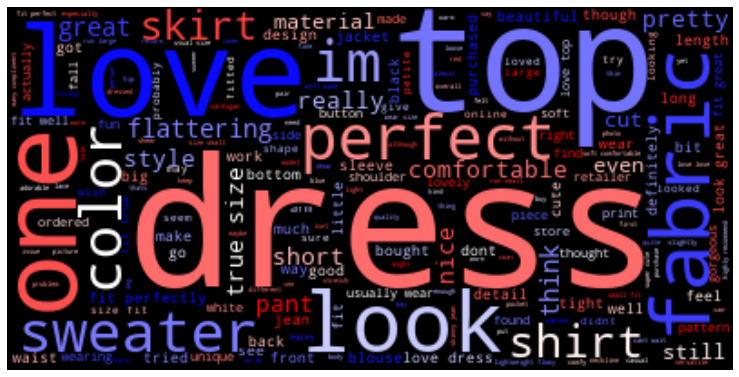

In [49]:
worldcloud = WordCloud(background_color="black", max_words =250, colormap='bwr')
worldcloud.generate(negative_reviews_words)
plt.figure(figsize = (13,13))
plt.imshow(worldcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

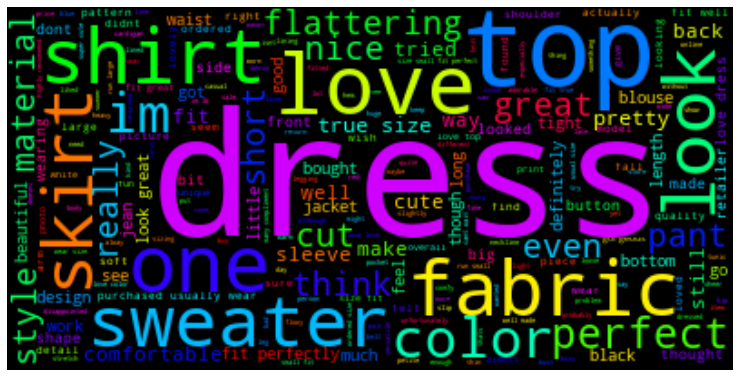

In [50]:
worldcloud = WordCloud(background_color="black", max_words =250, colormap='hsv')
worldcloud.generate(all_words)
plt.figure(figsize = (13,13))
plt.imshow(worldcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Word-Frequency

In [51]:
word_frequency = pd.Series(all_words.split(" ")).value_counts().sort_values(ascending=True)
word_frequency

platinum        1
weeding         1
coolness        1
raining         1
jules           1
            ...  
love         8992
size         9363
not          9951
fit         10128
dress       11352
Length: 11998, dtype: int64

In [52]:
# looking at the words that occur at most 2 times in the corpus:
rare = word_frequency[word_frequency < 3]
rare
",".join(rare.index)

'platinum,weeding,coolness,raining,jules,nyt,demand,avery,wilted,indiscretion,beautifullly,uiu,cury,rig,presentable,flory,yielded,combi,flamboyant,angela,sampler,cardig,boxines,lackadaisical,tryi,grading,hp,complemented,netted,paneling,lessened,cringing,airier,uncured,consists,tv,robs,mamma,comforable,peony,cunning,densest,burning,central,wuality,hipefully,nifty,thei,depend,overexposure,whittle,shimmying,hairy,practicing,actively,someway,lilka,straightened,pyjama,purpleish,fuscia,resource,racy,raggy,inadvertently,reto,environs,conundrum,halterneck,coastal,dominantly,uploaded,hesitancy,inwonderland,disturb,childsize,deligthfully,cosmetic,outfitting,jodhpur,recover,beacheress,gunmetal,experie,layover,beautifull,concealing,hoochie,colwyn,hallmark,upgraded,lasted,preshrunk,gravely,miserable,concentrate,insta,slump,taffita,plesantly,hoiday,tightish,retire,deff,glinting,besutiful,pressure,conditioner,tsp,googling,kitschy,minorly,restore,leaflet,wrent,ruffl,nominal,railroad,onlin,seafoam,blus

In [53]:
df["text"].apply(lambda x : " ".join([i for i in x.split() if i not in rare.index]))  # We can clear the words that occur at most 2 times from the text column in this way.

0              absolutely wonderful silky sexy comfortable
1        love dress sooo pretty happened find store im ...
2        high hope dress really wanted work initially o...
3        love love love jumpsuit fun flirty fabulous ev...
4        shirt flattering due adjustable front tie perf...
                               ...                        
22636    happy snag dress great price easy slip flatter...
22637    reminds maternity clothes soft stretchy shiny ...
22638    fit well top see never would worked im glad ab...
22639    bought dress wedding summer cute unfortunately...
22640    dress lovely feminine fit perfectly easy wear ...
Name: text, Length: 22641, dtype: object

In [54]:
# check the result
pd.Series(" ".join(df["text"].apply(lambda x : " ".join([i for i in x.split() if i not in rare.index]))).split(" ")).value_counts().sort_values(ascending=True)

owl                  3
wavering             3
crafty               3
accommodating        3
iteration            3
                 ...  
love              8992
size              9363
not               9951
fit              10128
dress            11352
Length: 5501, dtype: int64

## 5. Sentiment Classification with Machine Learning, Deep Learning and BERT model

Before moving on to modeling, as data preprocessing steps you will need to perform **[vectorization](https://machinelearningmastery.com/prepare-text-data-machine-learning-scikit-learn/)** and **train-test split**. You have performed many times train test split process before.
But you will perform the vectorization for the first time.

Machine learning algorithms most often take numeric feature vectors as input. Thus, when working with text documents, you need a way to convert each document into a numeric vector. This process is known as text vectorization. Commonly used vectorization approach that you will use here is to represent each text as a vector of word counts.

At this moment, you have your review text column as a token (which has no punctuations and stopwords). You can use Scikit-learn’s CountVectorizer to convert the text collection into a matrix of token counts. You can imagine this resulting matrix as a 2-D matrix, where each row is a unique word, and each column is a review.

Train all models using TFIDF and Count vectorizer data.

**For Deep learning model, use embedding layer for all words.** 

**For BERT model, use TF tensor**

After performing data preprocessing, build your models using following classification algorithms:

- Logistic Regression,
- Naive Bayes,
- Support Vector Machine,
- Random Forest,
- Ada Boosting
- Deep Learning Model
- BERT Model

### Train - Test Split

To run machine learning algorithms we need to convert text files into numerical feature vectors. We will use bag of words model for our analysis.

First we spliting the data into train and test sets:

In [55]:
df.head()

,label,text
0,0,absolutely wonderful silky sexy comfortable
1,0,love dress sooo pretty happened find store im ...
2,1,high hope dress really wanted work initially o...
3,0,love love love jumpsuit fun flirty fabulous ev...
4,0,shirt flattering due adjustable front tie perf...


In [56]:
df["label"].value_counts()  # imbalanced case

0    18540
1     4101
Name: label, dtype: int64

In [57]:
df["label"].value_counts(normalize=True)

0   0.819
1   0.181
Name: label, dtype: float64

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
X = df["text"]
y= df["label"]

In [60]:
random_state = 101

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify=y, random_state=random_state)

In [67]:
X_train.shape, X_test.shape

((19244,), (3397,))

In the next step we create a numerical feature vector for each document:

### Count Vectorization

In [68]:
from sklearn.feature_extraction.text import CountVectorizer

In [69]:
vectorizer = CountVectorizer(preprocessor=cleaning, min_df=3)
X_train_count = vectorizer.fit_transform(X_train)
X_test_count = vectorizer.transform(X_test)

In [70]:
# min_df=3
X_train_count.shape, X_test_count.shape

((19244, 5056), (3397, 5056))

In [71]:
pd.DataFrame(X_train_count.toarray(), columns = vectorizer.get_feature_names_out())

ab  abby  abdomen  ability  able  abo  absolute  absolutely  abstract  \
0       0     0        0        0     0    0         0           0         0   
1       0     0        0        0     0    0         0           0         0   
2       0     0        0        0     0    0         0           0         0   
3       0     0        0        0     0    0         0           0         0   
4       0     0        0        0     1    0         0           0         0   
...    ..   ...      ...      ...   ...  ...       ...         ...       ...   
19239   0     0        0        0     0    0         0           0         0   
19240   0     0        0        0     0    0         0           0         0   
19241   0     0        0        0     0    0         0           0         0   
19242   0     0        0        0     0    0         0           1         0   
19243   0     0        0        0     0    0         0           0         0   

       absurd  abt  abundance  ac  accent  accented  accentuate  accentuated  \
0           0    0          0   0       0         0           0            0   
1           0    0          0   0       0         0           0            0   
2           0    0          0   0       0         0           0            0   
3           0    0          0   0       0         0           0            0   
4           0    0          0   0       0         0           0            0   
...       ...  ...        ...  ..     ...       ...         ...          ...   
19239       0    0          0   0       0         0           0            0   
19240       0    0          0   0       0         0           0            0   
19241       0    0          0   0       0         0           0            0   
19242       0    0          0   0       0         0           0            0   
19243       0    0          0   0       0         0           0            0   

       accentuates  accentuating  accept  acceptable  access  accessorize  \
0                0             0       0           0       0            0   
1                0             0       0           0       0            0   
2                0             0       0           0       0            0   
3                0             0       0           0       0            0   
4                0             0       0           0       0            0   
...            ...           ...     ...         ...     ...          ...   
19239            0             0       0           0       0            0   
19240            0             0       0           0       0            0   
19241            0             0       0           0       0            0   
19242            0             0       0           0       0            0   
19243            0             0       0           0       0            0   

       accessorized  accessorizing  accessory  accident  accidental  \
0                 0              0          0         0           0   
1                 0              0          0         0           0   
2                 0              0          0         0           0   
3                 0              0          0         0           0   
4                 0              0          0         0           0   
...             ...            ...        ...       ...         ...   
19239             0              0          0         0           0   
19240             0              0          0         0           0   
19241             0              0          0         0           0   
19242             0              0          0         0           0   
19243             0              0          0         0           0   

       accidentally  accommodate  accommodates  according  accordingly  \
0                 0            0             0          0            0   
1                 0            0             0          0            0   
2                 0            0             0          0            0   
3          

### TF-IDF

In [72]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [73]:
tf_idf_vectorizer = TfidfVectorizer(preprocessor=cleaning, min_df=3)
X_train_tf_idf = tf_idf_vectorizer.fit_transform(X_train)
X_test_tf_idf = tf_idf_vectorizer.transform(X_test)

In [74]:
X_train_tf_idf.shape

(19244, 5056)

In [75]:
pd.DataFrame(X_train_count.toarray(), columns = vectorizer.get_feature_names_out())

ab  abby  abdomen  ability  able  abo  absolute  absolutely  abstract  \
0       0     0        0        0     0    0         0           0         0   
1       0     0        0        0     0    0         0           0         0   
2       0     0        0        0     0    0         0           0         0   
3       0     0        0        0     0    0         0           0         0   
4       0     0        0        0     1    0         0           0         0   
...    ..   ...      ...      ...   ...  ...       ...         ...       ...   
19239   0     0        0        0     0    0         0           0         0   
19240   0     0        0        0     0    0         0           0         0   
19241   0     0        0        0     0    0         0           0         0   
19242   0     0        0        0     0    0         0           1         0   
19243   0     0        0        0     0    0         0           0         0   

       absurd  abt  abundance  ac  accent  accented  accentuate  accentuated  \
0           0    0          0   0       0         0           0            0   
1           0    0          0   0       0         0           0            0   
2           0    0          0   0       0         0           0            0   
3           0    0          0   0       0         0           0            0   
4           0    0          0   0       0         0           0            0   
...       ...  ...        ...  ..     ...       ...         ...          ...   
19239       0    0          0   0       0         0           0            0   
19240       0    0          0   0       0         0           0            0   
19241       0    0          0   0       0         0           0            0   
19242       0    0          0   0       0         0           0            0   
19243       0    0          0   0       0         0           0            0   

       accentuates  accentuating  accept  acceptable  access  accessorize  \
0                0             0       0           0       0            0   
1                0             0       0           0       0            0   
2                0             0       0           0       0            0   
3                0             0       0           0       0            0   
4                0             0       0           0       0            0   
...            ...           ...     ...         ...     ...          ...   
19239            0             0       0           0       0            0   
19240            0             0       0           0       0            0   
19241            0             0       0           0       0            0   
19242            0             0       0           0       0            0   
19243            0             0       0           0       0            0   

       accessorized  accessorizing  accessory  accident  accidental  \
0                 0              0          0         0           0   
1                 0              0          0         0           0   
2                 0              0          0         0           0   
3                 0              0          0         0           0   
4                 0              0          0         0           0   
...             ...            ...        ...       ...         ...   
19239             0              0          0         0           0   
19240             0              0          0         0           0   
19241             0              0          0         0           0   
19242             0              0          0         0           0   
19243             0              0          0         0           0   

       accidentally  accommodate  accommodates  according  accordingly  \
0                 0            0             0          0            0   
1                 0            0             0          0            0   
2                 0            0             0          0            0   
3          

### Evaluation Metrics

In [76]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, confusion_matrix, classification_report

def eval(model, X_train, X_test):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    print(confusion_matrix(y_test, y_pred))
    print("Test_Set")
    print(classification_report(y_test,y_pred))
    print("Train_Set")
    print(classification_report(y_train,y_pred_train))

In [ ]:
# from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score, log_loss
# from sklearn.metrics import ConfusionMatrixDisplay, plot_confusion_matrix, confusion_matrix

# def eval_metric_classification(model, X_train, y_train, X_test, y_test, model_name='', average=None, labels=None):
#     """ average (None, 'micro', 'macro', 'samples', 'weighted', 'binary')"""
#     # The style parameters control properties like the color of the background and whether a grid is enabled by default.
#     sns.set_style("whitegrid", {'axes.grid' : False})
#     y_pred_test = model.predict(X_test)
#     y_pred_train = model.predict(X_train)
    
#     print("TEST REPORT")
#     print(classification_report(y_test, y_pred_test))
#     fig, ax = plt.subplots(2, 1, figsize=(6, 6))
#     ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax[0]);
#     print("\n"*1, "-*"*30)
#     print("TRAIN REPORT")
#     print(classification_report(y_train, y_pred_train))
#     ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, ax=ax[1]);
#     plt.tight_layout()
    
#     return pd.DataFrame.from_dict({
#         'accuracy_test' :accuracy_score(y_test, y_pred_test),
#         'f1_test'       :np.array(f1_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
#         'recall_test'   :np.array(recall_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
#         'precision_test':np.array(precision_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],        
#         'accuracy_train' :accuracy_score(y_train, y_pred_train),
#         'f1_train'       :np.array(f1_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],        
#         'recall_train'   :np.array(recall_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
#         'precision_train':np.array(precision_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
#     }, orient='index', columns=[model_name]).T

## Logistic Regression

### CountVectorizer

In [77]:
from sklearn.linear_model import LogisticRegression

log = LogisticRegression(C=1, class_weight= "balanced", max_iter=1000, random_state=random_state)
log.fit(X_train_count,y_train)

LogisticRegression(C=1, class_weight='balanced', max_iter=1000,
                   random_state=101)

In [78]:
print("LOG MODEL")
eval(log, X_train_count, X_test_count)

LOG MODEL
[[2473  309]
 [ 127  488]]
Test_Set
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      2782
           1       0.61      0.79      0.69       615

    accuracy                           0.87      3397
   macro avg       0.78      0.84      0.81      3397
weighted avg       0.89      0.87      0.88      3397

Train_Set
              precision    recall  f1-score   support

           0       0.99      0.92      0.96     15758
           1       0.73      0.97      0.83      3486

    accuracy                           0.93     19244
   macro avg       0.86      0.94      0.89     19244
weighted avg       0.95      0.93      0.93     19244



In [79]:
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

scoring = {'accuracy': make_scorer(accuracy_score),
            'precision-neg': make_scorer(precision_score, average=None, labels=[1]),
            'recall-neg': make_scorer(recall_score, average=None, labels = [1]),
            'f1-neg': make_scorer(f1_score, average=None, labels = [1])}

In [81]:
from sklearn.model_selection import cross_validate

model = LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=random_state) 
scores = cross_validate(model, X_train_count, y_train, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,0.973,0.010,0.863,0.937,0.590,0.751,0.789,0.974,0.675,0.848
2,1.056,0.011,0.872,0.937,0.619,0.752,0.760,0.971,0.683,0.848
3,0.825,0.006,0.863,0.937,0.596,0.753,0.756,0.970,0.667,0.848
4,0.751,0.006,0.876,0.935,0.621,0.744,0.815,0.975,0.705,0.844
5,0.671,0.006,0.868,0.936,0.601,0.749,0.801,0.972,0.687,0.846


test_accuracy         0.868
train_accuracy        0.936
test_precision-neg    0.606
train_precision-neg   0.750
test_recall-neg       0.784
train_recall-neg      0.972
test_f1-neg           0.683
train_f1-neg          0.847
dtype: float64

#### GridSearch for Logistic Regression by using Count Vectorizer

In [114]:
recall_neg = make_scorer(recall_score, average=None, labels = [1])  # according to recall for 1 class

In [115]:
from sklearn.model_selection import GridSearchCV

model = LogisticRegression(max_iter=1000, random_state=random_state)

penalty = ["l2"]
C = [0.01, 0.02,0.03, 0.05, 0.08, 0.1,0.2]
class_weight= ["balanced"] 
solver = ["sag", "saga", "liblinear"]

param_grid = {
              "penalty" : penalty,
              "C" : C,
              "class_weight":class_weight,
              "solver":solver
          }

grid_log_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [116]:
%%time
grid_log_model.fit(X_train_count, y_train)

CPU times: user 845 ms, sys: 83.9 ms, total: 929 ms
Wall time: 23.9 s


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000, random_state=101),
             n_jobs=-1,
             param_grid={'C': [0.01, 0.02, 0.03, 0.05, 0.08, 0.1, 0.2],
                         'class_weight': ['balanced'], 'penalty': ['l2'],
                         'solver': ['sag', 'saga', 'liblinear']},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [117]:
grid_log_model.best_params_

{'C': 0.02, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'liblinear'}

In [118]:
grid_log_model.best_score_

0.8508318499669068

In [119]:
print("GRID LOG MODEL BALANCED")
eval(grid_log_model, X_train_count, X_test_count)

GRID LOG MODEL BALANCED
[[2374  408]
 [  91  524]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      2782
           1       0.56      0.85      0.68       615

    accuracy                           0.85      3397
   macro avg       0.76      0.85      0.79      3397
weighted avg       0.89      0.85      0.86      3397

Train_Set
              precision    recall  f1-score   support

           0       0.97      0.87      0.92     15758
           1       0.60      0.90      0.72      3486

    accuracy                           0.87     19244
   macro avg       0.79      0.88      0.82     19244
weighted avg       0.91      0.87      0.88     19244



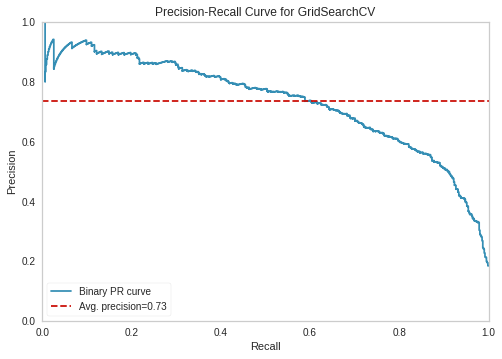

In [120]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_log_model,
    classes=grid_log_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

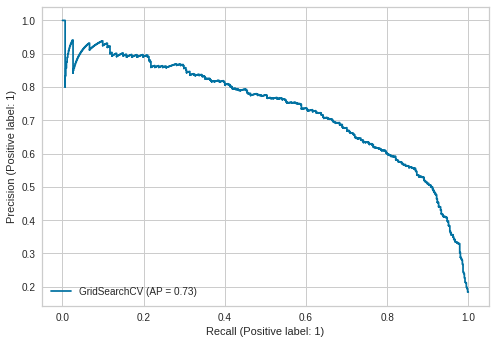

In [121]:
from sklearn.metrics import PrecisionRecallDisplay, plot_precision_recall_curve
# plot_precision_recall_curve(grid_log_model, X_test_count, y_test, pos_label=0);
PrecisionRecallDisplay.from_estimator(grid_log_model, X_test_count, y_test, pos_label=1);

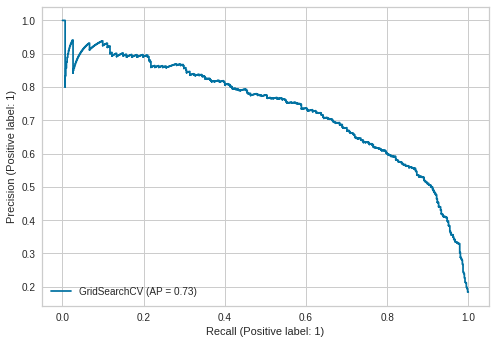

In [122]:
from sklearn.metrics import plot_precision_recall_curve
plot_precision_recall_curve(grid_log_model, X_test_count, y_test);

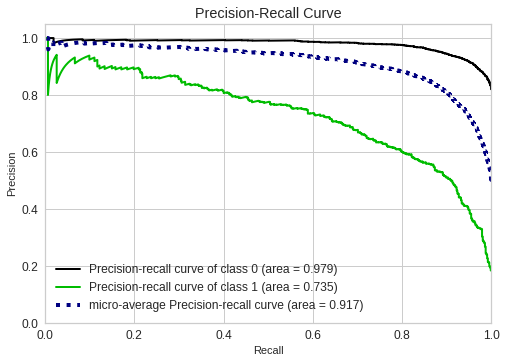

In [123]:
!pip install scikit-plot -q
import scikitplot as skplt

y_probas = grid_log_model.predict_proba(X_test_count)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [124]:
y_pred = grid_log_model.predict(X_test_count)
log_count_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
log_count_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
log_count_accuracy_neg = accuracy_score(y_test, y_pred)
log_count_AP_neg = viz.score_

### TF-IDF

In [125]:
from sklearn.linear_model import LogisticRegression

log = LogisticRegression(C=1, class_weight= "balanced",max_iter=1000, random_state=random_state)
log.fit(X_train_tf_idf, y_train)

LogisticRegression(C=1, class_weight='balanced', max_iter=1000,
                   random_state=101)

In [126]:
print("LOG MODEL")
eval(log, X_train_tf_idf, X_test_tf_idf)

LOG MODEL
[[2397  385]
 [  88  527]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.86      0.91      2782
           1       0.58      0.86      0.69       615

    accuracy                           0.86      3397
   macro avg       0.77      0.86      0.80      3397
weighted avg       0.89      0.86      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.89      0.93     15758
           1       0.64      0.93      0.76      3486

    accuracy                           0.89     19244
   macro avg       0.81      0.91      0.85     19244
weighted avg       0.92      0.89      0.90     19244



In [127]:
model = LogisticRegression(C=1, class_weight='balanced', max_iter=1000, random_state=random_state) 
scores = cross_validate(model, X_train_tf_idf, y_train, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy         0.867
train_accuracy        0.896
test_precision-neg    0.593
train_precision-neg   0.648
test_recall-neg       0.851
train_recall-neg      0.934
test_f1-neg           0.699
train_f1-neg          0.765
dtype: float64

#### GridSearch for Logistic Regression by using TFIDF Vectorizer

In [128]:
from sklearn.model_selection import GridSearchCV

model = LogisticRegression(max_iter=1000,random_state=random_state)

penalty = ["l2"]
C = [0.05, 0.08, 0.1,0.2,1,2]
class_weight= ["balanced"] 
solver = ["sag","saga","liblinear"]


param_grid = {"penalty" : penalty,
              "C" : C,
              "class_weight":class_weight,
              "solver":solver
          }


grid_logtf_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [129]:
%%time
grid_logtf_model.fit(X_train_tf_idf,y_train)

CPU times: user 787 ms, sys: 68.9 ms, total: 856 ms
Wall time: 19.4 s


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000, random_state=101),
             n_jobs=-1,
             param_grid={'C': [0.05, 0.08, 0.1, 0.2, 1, 2],
                         'class_weight': ['balanced'], 'penalty': ['l2'],
                         'solver': ['sag', 'saga', 'liblinear']},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [130]:
grid_logtf_model.best_params_

{'C': 0.2, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'sag'}

In [131]:
grid_logtf_model.best_score_

0.8625899783353134

In [132]:
eval(grid_logtf_model, X_train_tf_idf, X_test_tf_idf)

[[2364  418]
 [  86  529]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.85      0.90      2782
           1       0.56      0.86      0.68       615

    accuracy                           0.85      3397
   macro avg       0.76      0.85      0.79      3397
weighted avg       0.89      0.85      0.86      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.86      0.91     15758
           1       0.59      0.90      0.71      3486

    accuracy                           0.87     19244
   macro avg       0.78      0.88      0.81     19244
weighted avg       0.91      0.87      0.88     19244



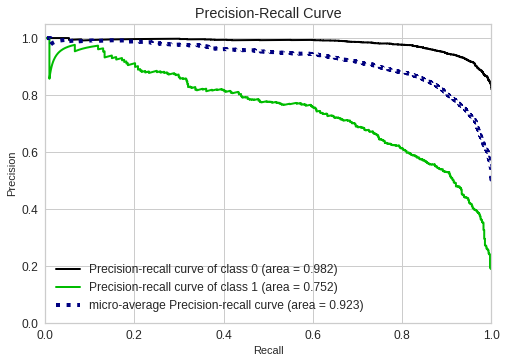

In [133]:
y_probas = grid_logtf_model.predict_proba(X_test_tf_idf)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

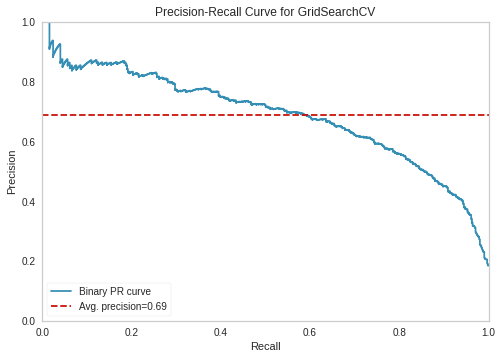

In [134]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_logtf_model,
    classes=grid_logtf_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

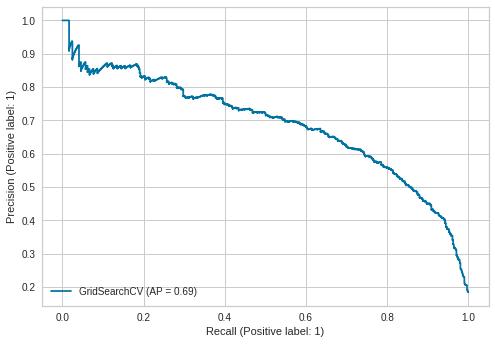

In [135]:
PrecisionRecallDisplay.from_estimator(grid_logtf_model, X_test_count, y_test, pos_label=1);

In [136]:
y_pred = grid_logtf_model.predict(X_test_count)
log_tfidf_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
log_tfidf_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
log_tfidf_accuracy_neg = accuracy_score(y_test, y_pred)
log_tfidf_AP_neg = viz.score_

## Naive Bayes 

### Countvectorizer

In [137]:
from sklearn.utils import class_weight

classes_weights = class_weight.compute_sample_weight(class_weight='balanced', y=y_train)
classes_weights

array([0.61061048, 0.61061048, 2.76018359, ..., 0.61061048, 0.61061048,
       0.61061048])

In [ ]:
# from sklearn.utils import class_weight

# class_weights = dict(
#     zip(np.unique(y_train),
#         class_weight.compute_class_weight(
#             class_weight = 'balanced',
#             classes = np.unique(y_train), 
#             y = y_train)
# ))
# class_weights

In [139]:
from sklearn.naive_bayes import BernoulliNB

nb = BernoulliNB(alpha=1) 
nb.fit(X_train_count,y_train,sample_weight=classes_weights)

BernoulliNB(alpha=1)

In [140]:
print("NB MODEL")
eval(nb, X_train_count, X_test_count)

NB MODEL
[[2384  398]
 [  85  530]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.86      0.91      2782
           1       0.57      0.86      0.69       615

    accuracy                           0.86      3397
   macro avg       0.77      0.86      0.80      3397
weighted avg       0.89      0.86      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.87      0.92     15758
           1       0.61      0.92      0.73      3486

    accuracy                           0.88     19244
   macro avg       0.79      0.89      0.83     19244
weighted avg       0.91      0.88      0.89     19244



In [141]:
model = BernoulliNB(alpha=1)
scores = cross_validate(model, X_train_count, y_train,fit_params={"sample_weight":classes_weights}, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,0.011,0.008,0.857,0.882,0.568,0.616,0.877,0.919,0.689,0.738
2,0.010,0.007,0.865,0.880,0.588,0.613,0.844,0.923,0.693,0.736
3,0.009,0.007,0.852,0.880,0.563,0.613,0.832,0.920,0.671,0.736
4,0.013,0.008,0.857,0.881,0.570,0.614,0.865,0.918,0.688,0.736
5,0.010,0.008,0.860,0.880,0.576,0.612,0.865,0.925,0.692,0.737


test_accuracy         0.858
train_accuracy        0.881
test_precision-neg    0.573
train_precision-neg   0.614
test_recall-neg       0.857
train_recall-neg      0.921
test_f1-neg           0.687
train_f1-neg          0.737
dtype: float64

#### GridSearch for Naive Bayes by using Count Vectorizer

In [147]:
from sklearn.model_selection import GridSearchCV

model = BernoulliNB()

alpha = np.linspace(-2,10,100)  

param_grid = {
              "alpha" : alpha   
          }

grid_nb_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [148]:
%%time
grid_nb_model.fit(X_train_count,y_train,sample_weight=classes_weights)

CPU times: user 837 ms, sys: 76.6 ms, total: 914 ms
Wall time: 6.18 s


GridSearchCV(cv=5, estimator=BernoulliNB(), n_jobs=-1,
             param_grid={'alpha': array([-2.        , -1.87878788, -1.75757576, -1.63636364, -1.51515152,
       -1.39393939, -1.27272727, -1.15151515, -1.03030303, -0.90909091,
       -0.78787879, -0.66666667, -0.54545455, -0.42424242, -0.3030303 ,
       -0.18181818, -0.06060606,  0.06060606,  0.18181818,  0.3030303 ,
        0.42424242,  0.54545455,  0.66666667,  0.78787879,...
        6.48484848,  6.60606061,  6.72727273,  6.84848485,  6.96969697,
        7.09090909,  7.21212121,  7.33333333,  7.45454545,  7.57575758,
        7.6969697 ,  7.81818182,  7.93939394,  8.06060606,  8.18181818,
        8.3030303 ,  8.42424242,  8.54545455,  8.66666667,  8.78787879,
        8.90909091,  9.03030303,  9.15151515,  9.27272727,  9.39393939,
        9.51515152,  9.63636364,  9.75757576,  9.87878788, 10.        ])},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [150]:
grid_nb_model.best_params_

{'alpha': 6.363636363636363}

In [151]:
grid_nb_model.best_score_

0.8763616481605571

In [152]:
eval(grid_nb_model, X_train_count, X_test_count)

[[2360  422]
 [  79  536]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.90      2782
           1       0.56      0.87      0.68       615

    accuracy                           0.85      3397
   macro avg       0.76      0.86      0.79      3397
weighted avg       0.89      0.85      0.86      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.86      0.91     15758
           1       0.58      0.91      0.71      3486

    accuracy                           0.87     19244
   macro avg       0.78      0.88      0.81     19244
weighted avg       0.91      0.87      0.88     19244



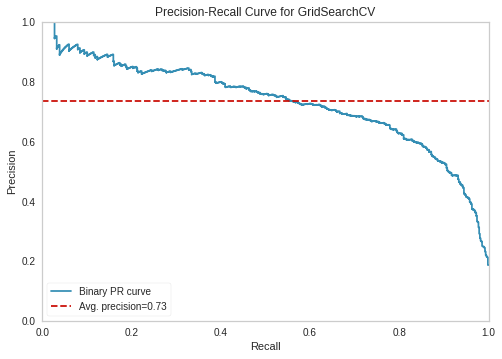

In [154]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_nb_model,
    classes=grid_nb_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

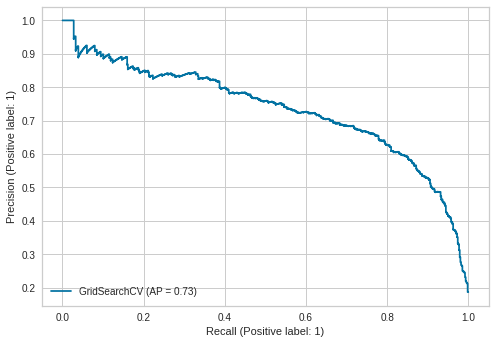

In [155]:
from sklearn.metrics import PrecisionRecallDisplay, plot_precision_recall_curve
PrecisionRecallDisplay.from_estimator(grid_nb_model, X_test_count, y_test, pos_label=1);

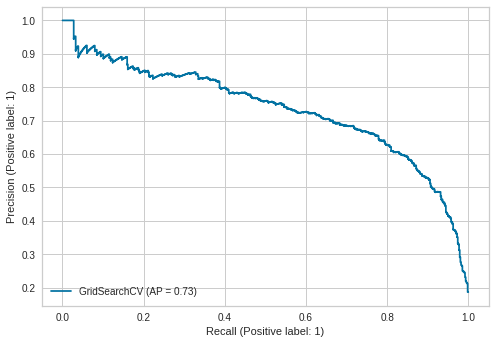

In [156]:
from sklearn.metrics import plot_precision_recall_curve
plot_precision_recall_curve(grid_nb_model, X_test_count, y_test);

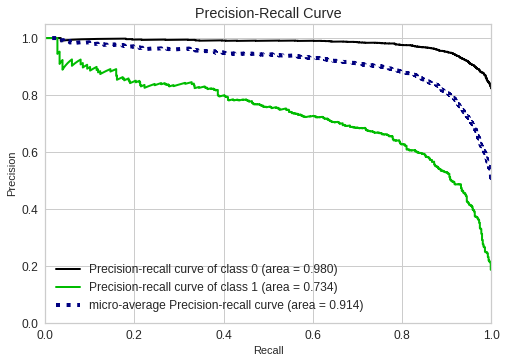

In [157]:
!pip install scikit-plot -q
import scikitplot as skplt

y_probas = grid_nb_model.predict_proba(X_test_count)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [158]:
y_pred = grid_nb_model.predict(X_test_count)
nb_count_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
nb_count_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
nb_count_accuracy_neg = accuracy_score(y_test, y_pred)
nb_count_AP_neg = viz.score_

### TF-IDF

In [159]:
nb = BernoulliNB(alpha=1)
nb.fit(X_train_tf_idf,y_train,sample_weight=classes_weights)

BernoulliNB(alpha=1)

In [160]:
print("NB MODEL")
eval(nb, X_train_tf_idf, X_test_tf_idf)

NB MODEL
[[2384  398]
 [  85  530]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.86      0.91      2782
           1       0.57      0.86      0.69       615

    accuracy                           0.86      3397
   macro avg       0.77      0.86      0.80      3397
weighted avg       0.89      0.86      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.87      0.92     15758
           1       0.61      0.92      0.73      3486

    accuracy                           0.88     19244
   macro avg       0.79      0.89      0.83     19244
weighted avg       0.91      0.88      0.89     19244



In [161]:
model = BernoulliNB(alpha=1) 
scores = cross_validate(model, X_train_tf_idf, y_train, fit_params={"sample_weight":classes_weights},scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,0.024,0.012,0.857,0.882,0.568,0.616,0.877,0.919,0.689,0.738
2,0.015,0.012,0.865,0.880,0.588,0.613,0.844,0.923,0.693,0.736
3,0.016,0.012,0.852,0.880,0.563,0.613,0.832,0.920,0.671,0.736
4,0.014,0.012,0.857,0.881,0.570,0.614,0.865,0.918,0.688,0.736
5,0.014,0.012,0.860,0.880,0.576,0.612,0.865,0.925,0.692,0.737


test_accuracy         0.858
train_accuracy        0.881
test_precision-neg    0.573
train_precision-neg   0.614
test_recall-neg       0.857
train_recall-neg      0.921
test_f1-neg           0.687
train_f1-neg          0.737
dtype: float64

#### GridSearch for NB by Using TFIDF Vectorizer

In [163]:
from sklearn.model_selection import GridSearchCV

model = BernoulliNB()

alpha = np.linspace(-2,10,100) 

param_grid = {
              "alpha" : alpha
          }

grid_nbtf_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [164]:
%%time
grid_nbtf_model.fit(X_train_tf_idf,y_train,sample_weight=classes_weights)

CPU times: user 853 ms, sys: 82.4 ms, total: 935 ms
Wall time: 8.21 s


GridSearchCV(cv=5, estimator=BernoulliNB(), n_jobs=-1,
             param_grid={'alpha': array([-2.        , -1.87878788, -1.75757576, -1.63636364, -1.51515152,
       -1.39393939, -1.27272727, -1.15151515, -1.03030303, -0.90909091,
       -0.78787879, -0.66666667, -0.54545455, -0.42424242, -0.3030303 ,
       -0.18181818, -0.06060606,  0.06060606,  0.18181818,  0.3030303 ,
        0.42424242,  0.54545455,  0.66666667,  0.78787879,...
        6.48484848,  6.60606061,  6.72727273,  6.84848485,  6.96969697,
        7.09090909,  7.21212121,  7.33333333,  7.45454545,  7.57575758,
        7.6969697 ,  7.81818182,  7.93939394,  8.06060606,  8.18181818,
        8.3030303 ,  8.42424242,  8.54545455,  8.66666667,  8.78787879,
        8.90909091,  9.03030303,  9.15151515,  9.27272727,  9.39393939,
        9.51515152,  9.63636364,  9.75757576,  9.87878788, 10.        ])},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [165]:
grid_nbtf_model.best_params_

{'alpha': 6.363636363636363}

In [166]:
grid_nbtf_model.best_score_

0.8763616481605571

In [168]:
eval(grid_nbtf_model, X_train_tf_idf, X_test_tf_idf)

[[2360  422]
 [  79  536]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.90      2782
           1       0.56      0.87      0.68       615

    accuracy                           0.85      3397
   macro avg       0.76      0.86      0.79      3397
weighted avg       0.89      0.85      0.86      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.86      0.91     15758
           1       0.58      0.91      0.71      3486

    accuracy                           0.87     19244
   macro avg       0.78      0.88      0.81     19244
weighted avg       0.91      0.87      0.88     19244



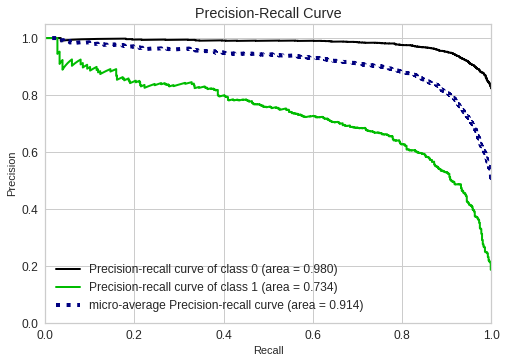

In [173]:
y_probas = grid_nbtf_model.predict_proba(X_test_tf_idf)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

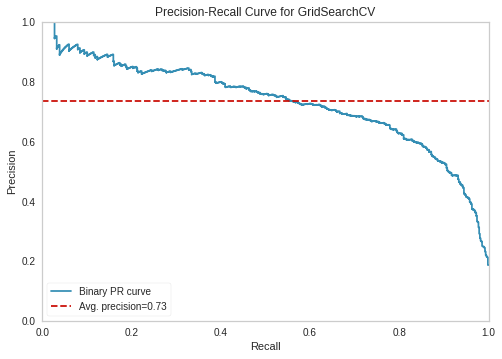

In [174]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_nbtf_model,
    classes=grid_nbtf_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

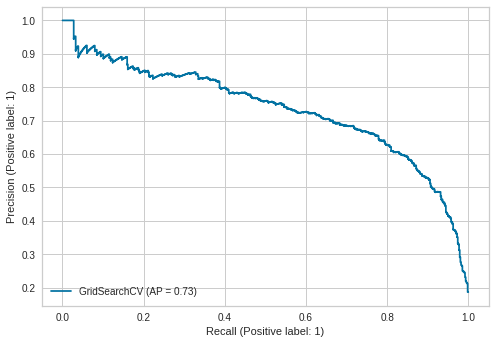

In [175]:
PrecisionRecallDisplay.from_estimator(grid_nbtf_model, X_test_count, y_test, pos_label=1);

In [176]:
y_pred = grid_nbtf_model.predict(X_test_count)
nb_tfidf_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
nb_tfidf_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
nb_tfidf_accuracy_neg = accuracy_score(y_test, y_pred)
nb_tfidf_AP_neg = viz.score_

## Support Vector Machine (SVM)

### Countvectorizer

In [179]:
from sklearn.svm import LinearSVC

svc = LinearSVC(C=1, class_weight="balanced", max_iter=1000, random_state=random_state)
svc.fit(X_train_count,y_train)

LinearSVC(C=1, class_weight='balanced', random_state=101)

In [180]:
print("SVC MODEL")
eval(svc, X_train_count, X_test_count)

SVC MODEL
[[2475  307]
 [ 173  442]]
Test_Set
              precision    recall  f1-score   support

           0       0.93      0.89      0.91      2782
           1       0.59      0.72      0.65       615

    accuracy                           0.86      3397
   macro avg       0.76      0.80      0.78      3397
weighted avg       0.87      0.86      0.86      3397

Train_Set
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     15758
           1       0.82      0.98      0.89      3486

    accuracy                           0.96     19244
   macro avg       0.91      0.97      0.93     19244
weighted avg       0.96      0.96      0.96     19244



In [181]:
model = LinearSVC( class_weight='balanced',random_state=random_state)
scores = cross_validate(model, X_train_count, y_train, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,1.220,0.007,0.837,0.969,0.540,0.862,0.676,0.989,0.600,0.921
2,0.875,0.006,0.854,0.968,0.582,0.857,0.684,0.990,0.629,0.919
3,0.845,0.006,0.853,0.969,0.582,0.858,0.677,0.991,0.626,0.919
4,0.851,0.008,0.862,0.968,0.602,0.857,0.708,0.988,0.651,0.918
5,0.866,0.007,0.851,0.967,0.570,0.854,0.720,0.990,0.636,0.917


test_accuracy         0.851
train_accuracy        0.968
test_precision-neg    0.575
train_precision-neg   0.858
test_recall-neg       0.693
train_recall-neg      0.990
test_f1-neg           0.628
train_f1-neg          0.919
dtype: float64

#### GridSearch for LinearSVC model by Using Count Vectorizer

In [182]:
recall_neg = make_scorer(recall_score, average=None, labels = [1])

In [183]:
from sklearn.model_selection import GridSearchCV

model = LinearSVC(class_weight='balanced',random_state=random_state)

penalty = ["l1", "l2"]
C = [0.0001,0.001,0.002,0.003,0.005, 0.01, 0.03, 0.06,0.1,0.5,0.8,1.5, 2 ]

param_grid = {
              "penalty" : penalty,
              "C" : C
          }


grid_svc_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [184]:
%%time
grid_svc_model.fit(X_train_count,y_train)

CPU times: user 512 ms, sys: 113 ms, total: 625 ms
Wall time: 23.5 s


GridSearchCV(cv=5,
             estimator=LinearSVC(class_weight='balanced', random_state=101),
             n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.002, 0.003, 0.005, 0.01, 0.03,
                               0.06, 0.1, 0.5, 0.8, 1.5, 2],
                         'penalty': ['l1', 'l2']},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [185]:
grid_svc_model.best_params_

{'C': 0.002, 'penalty': 'l2'}

In [186]:
grid_svc_model.best_score_

0.8539865900934418

In [187]:
eval(grid_svc_model, X_train_count, X_test_count)

[[2374  408]
 [  83  532]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.91      2782
           1       0.57      0.87      0.68       615

    accuracy                           0.86      3397
   macro avg       0.77      0.86      0.80      3397
weighted avg       0.89      0.86      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.97      0.87      0.92     15758
           1       0.60      0.90      0.72      3486

    accuracy                           0.87     19244
   macro avg       0.79      0.88      0.82     19244
weighted avg       0.91      0.87      0.88     19244



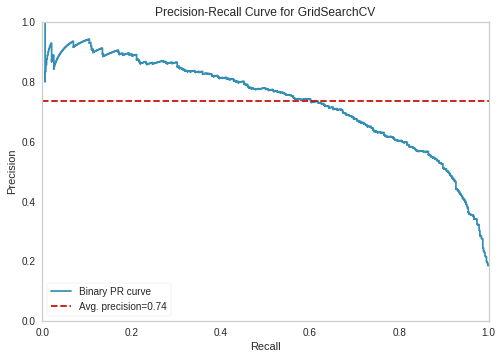

In [188]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_svc_model,
    classes=grid_svc_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

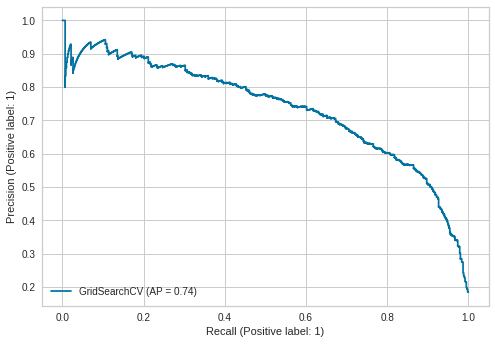

In [189]:
from sklearn.metrics import PrecisionRecallDisplay, plot_precision_recall_curve
PrecisionRecallDisplay.from_estimator(grid_svc_model, X_test_count, y_test, pos_label=1);

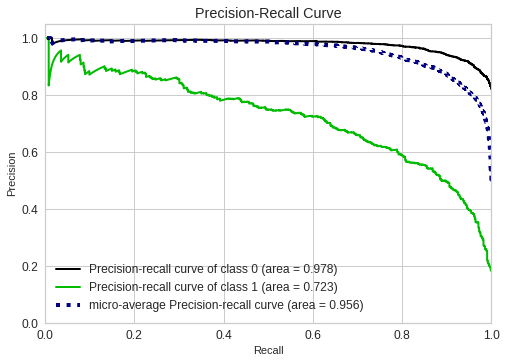

In [190]:
from sklearn.calibration import CalibratedClassifierCV

calibrated_svc = CalibratedClassifierCV(
    # base_estimator=LinearSVC(C=0.05, class_weight='balanced', random_state=random_state),
    base_estimator=grid_svc_model, 
    method='sigmoid',
    cv=4, 
)
calibrated_svc.fit(X_train_count, y_train)

y_probas = calibrated_svc.predict_proba(X_test_count)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [191]:
y_pred = grid_svc_model.predict(X_test_count)
svc_count_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
svc_count_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
svc_count_accuracy_neg = accuracy_score(y_test, y_pred)
svc_count_AP_neg = viz.score_

### TD-IDF

In [192]:
from sklearn.svm import LinearSVC

svc = LinearSVC(C=1, class_weight="balanced", random_state=random_state)
svc.fit(X_train_tf_idf,y_train)

LinearSVC(C=1, class_weight='balanced', random_state=101)

In [193]:
print("SVC MODEL")
eval(svc, X_train_tf_idf, X_test_tf_idf)

SVC MODEL
[[2450  332]
 [ 119  496]]
Test_Set
              precision    recall  f1-score   support

           0       0.95      0.88      0.92      2782
           1       0.60      0.81      0.69       615

    accuracy                           0.87      3397
   macro avg       0.78      0.84      0.80      3397
weighted avg       0.89      0.87      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.99      0.92      0.95     15758
           1       0.72      0.97      0.83      3486

    accuracy                           0.93     19244
   macro avg       0.86      0.95      0.89     19244
weighted avg       0.94      0.93      0.93     19244



In [194]:
model = LinearSVC( class_weight='balanced',random_state=random_state)
scores = cross_validate(model, X_train_tf_idf, y_train, scoring = scoring, cv = 5,return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,0.214,0.010,0.856,0.935,0.575,0.744,0.795,0.977,0.667,0.845
2,0.209,0.011,0.867,0.936,0.604,0.745,0.766,0.980,0.676,0.847
3,0.224,0.010,0.862,0.935,0.594,0.744,0.752,0.976,0.664,0.845
4,0.235,0.010,0.873,0.933,0.613,0.736,0.821,0.979,0.702,0.840
5,0.213,0.010,0.866,0.932,0.597,0.734,0.802,0.977,0.684,0.838


test_accuracy         0.865
train_accuracy        0.934
test_precision-neg    0.596
train_precision-neg   0.741
test_recall-neg       0.787
train_recall-neg      0.978
test_f1-neg           0.678
train_f1-neg          0.843
dtype: float64

#### GridSearch for LinearSVC model by Using TFIDF Vectorizer

In [ ]:
recall_neg = make_scorer(recall_score, average=None, labels = [1])

In [196]:
from sklearn.model_selection import GridSearchCV

model = LinearSVC( class_weight='balanced',random_state=random_state)

penalty = ["l1", "l2"]
C = [0.0001,0.001,0.005, 0.01, 0.03, 0.06,0.1,0.5,0.8,1.5, 2 ] 

param_grid = {"penalty" : penalty,
              "C" : C
          }


grid_svctf_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [197]:
%%time
grid_svctf_model.fit(X_train_tf_idf,y_train)

CPU times: user 385 ms, sys: 32.4 ms, total: 417 ms
Wall time: 6.13 s


GridSearchCV(cv=5,
             estimator=LinearSVC(class_weight='balanced', random_state=101),
             n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.005, 0.01, 0.03, 0.06, 0.1, 0.5,
                               0.8, 1.5, 2],
                         'penalty': ['l1', 'l2']},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [198]:
grid_svctf_model.best_params_

{'C': 0.03, 'penalty': 'l2'}

In [199]:
grid_svctf_model.best_score_

0.8677525045939823

In [200]:
eval(grid_svctf_model, X_train_tf_idf, X_test_tf_idf)

[[2372  410]
 [  79  536]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.91      2782
           1       0.57      0.87      0.69       615

    accuracy                           0.86      3397
   macro avg       0.77      0.86      0.80      3397
weighted avg       0.90      0.86      0.87      3397

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.87      0.92     15758
           1       0.60      0.91      0.72      3486

    accuracy                           0.87     19244
   macro avg       0.79      0.89      0.82     19244
weighted avg       0.91      0.87      0.88     19244



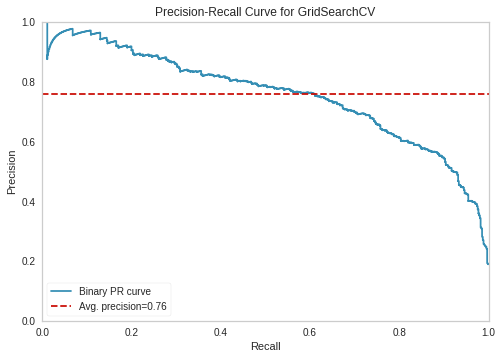

In [203]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_svctf_model,
    classes=grid_svctf_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();
# for class 1

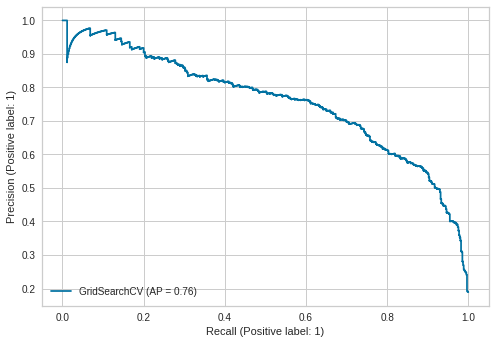

In [204]:
from sklearn.metrics import PrecisionRecallDisplay, plot_precision_recall_curve
PrecisionRecallDisplay.from_estimator(grid_svctf_model, X_test_tf_idf, y_test, pos_label=1);

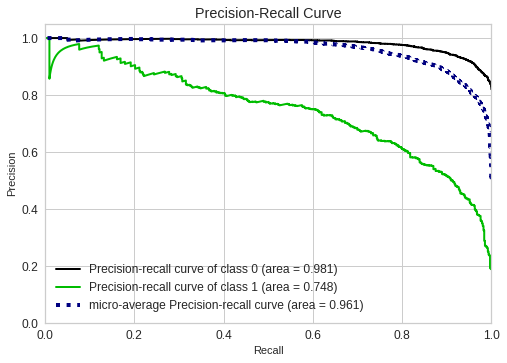

In [205]:
from sklearn.calibration import CalibratedClassifierCV

calibrated_svc = CalibratedClassifierCV(
    # base_estimator=LinearSVC(C=0.05, class_weight='balanced', random_state=random_state),
    base_estimator=grid_svctf_model, 
    method='sigmoid',
    cv=4, 
)
calibrated_svc.fit(X_train_tf_idf, y_train)

y_probas = calibrated_svc.predict_proba(X_test_tf_idf)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [207]:
y_pred = grid_svctf_model.predict(X_test_tf_idf)
svc_tfidf_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
svc_tfidf_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
svc_tfidf_accuracy_neg = accuracy_score(y_test, y_pred)
svc_tfidf_AP_neg = viz.score_

## Random Forest

### Countvectorizer

In [208]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state = random_state, n_jobs = -1, class_weight="balanced")
rf.fit(X_train_count, y_train)

RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=101)

In [209]:
print("RF MODEL BALANCED")
eval(rf, X_train_count, X_test_count)

RF MODEL BALANCED
[[2748   34]
 [ 441  174]]
Test_Set
              precision    recall  f1-score   support

           0       0.86      0.99      0.92      2782
           1       0.84      0.28      0.42       615

    accuracy                           0.86      3397
   macro avg       0.85      0.64      0.67      3397
weighted avg       0.86      0.86      0.83      3397

Train_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     15758
           1       1.00      1.00      1.00      3486

    accuracy                           1.00     19244
   macro avg       1.00      1.00      1.00     19244
weighted avg       1.00      1.00      1.00     19244



In [ ]:
model = RandomForestClassifier(random_state = random_state, n_jobs = -1, class_weight="balanced")
scores = cross_validate(model, X_train_count, y_train, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

test_accuracy          0.861694
train_accuracy         1.000000
test_precision-neg     0.837348
train_precision-neg    1.000000
test_recall-neg        0.294119
train_recall-neg       1.000000
test_f1-neg            0.434872
train_f1-neg           1.000000
dtype: float64

#### Gridsearch for Random Forest by Using Count Vectorizer

In [211]:
param_grid = {'n_estimators':[100,150,200],  #[100,150,200]
             'max_depth':[3,5,10,20]} # [3,5,10]
            
model = RandomForestClassifier(class_weight="balanced", random_state=random_state)

grid_rf_model = GridSearchCV(model,
                             param_grid,                        
                             scoring=recall_neg,
                             cv=5,
                             n_jobs=-1)            

In [212]:
%%time
grid_rf_model.fit(X_train_count,y_train)

CPU times: user 1.57 s, sys: 158 ms, total: 1.73 s
Wall time: 1min 13s


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=101),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10, 20],
                         'n_estimators': [100, 150, 200]},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [213]:
grid_rf_model.best_params_

{'max_depth': 5, 'n_estimators': 200}

In [214]:
grid_rf_model.best_score_

0.8083805749569379

In [216]:
eval(grid_rf_model, X_train_count, X_test_count) 

[[2269  513]
 [  99  516]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.82      0.88      2782
           1       0.50      0.84      0.63       615

    accuracy                           0.82      3397
   macro avg       0.73      0.83      0.75      3397
weighted avg       0.88      0.82      0.84      3397

Train_Set
              precision    recall  f1-score   support

           0       0.96      0.82      0.89     15758
           1       0.51      0.86      0.64      3486

    accuracy                           0.83     19244
   macro avg       0.74      0.84      0.77     19244
weighted avg       0.88      0.83      0.84     19244



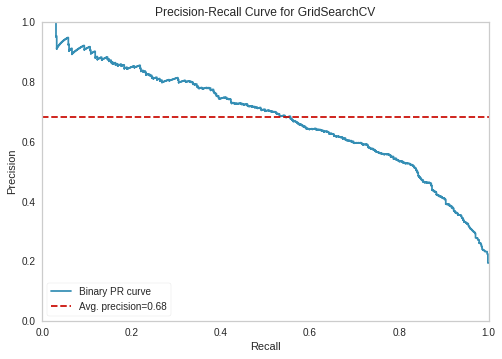

In [223]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_rf_model,
    classes=grid_rf_model.classes_,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();
# for class 1

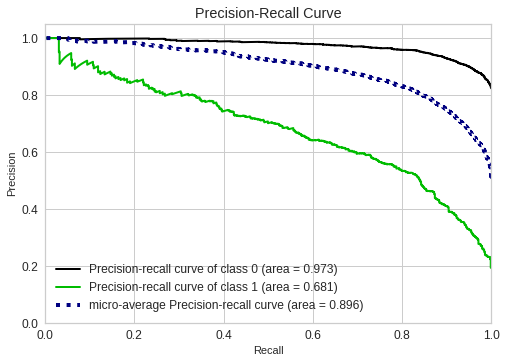

In [217]:
y_probas = grid_rf_model.predict_proba(X_test_count)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

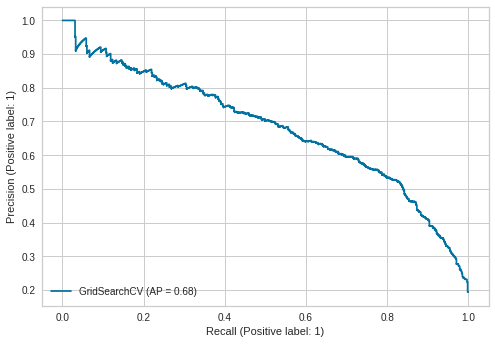

In [219]:
plot_precision_recall_curve(grid_rf_model, X_test_count, y_test, pos_label=1)

In [225]:
y_pred = grid_rf_model.predict(X_test_count)
rf_count_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
rf_count_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
rf_count_accuracy_neg = accuracy_score(y_test, y_pred)
rf_count_AP_neg = viz.score_

0.6814942152587453

### TF-IDF

In [226]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state = random_state, n_jobs = -1, class_weight="balanced")
rf.fit(X_train_tf_idf, y_train)

RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=101)

In [227]:
print("RF MODEL BALANCED")
eval(rf, X_train_tf_idf, X_test_count)

RF MODEL BALANCED
[[2779    3]
 [ 571   44]]
Test_Set
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      2782
           1       0.94      0.07      0.13       615

    accuracy                           0.83      3397
   macro avg       0.88      0.54      0.52      3397
weighted avg       0.85      0.83      0.77      3397

Train_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     15758
           1       1.00      1.00      1.00      3486

    accuracy                           1.00     19244
   macro avg       1.00      1.00      1.00     19244
weighted avg       1.00      1.00      1.00     19244



In [228]:
model = RandomForestClassifier(random_state = random_state, n_jobs = -1, class_weight="balanced")
scores = cross_validate(model, X_train_tf_idf, y_train, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,9.160,0.214,0.861,1.000,0.793,1.000,0.313,1.000,0.449,1.000
2,8.308,0.208,0.860,1.000,0.854,1.000,0.277,1.000,0.418,1.000
3,8.286,0.210,0.853,1.000,0.810,1.000,0.245,1.000,0.377,1.000
4,8.545,0.208,0.857,1.000,0.830,1.000,0.265,1.000,0.402,1.000
5,8.032,0.209,0.864,1.000,0.847,1.000,0.303,1.000,0.446,1.000


test_accuracy         0.859
train_accuracy        1.000
test_precision-neg    0.827
train_precision-neg   1.000
test_recall-neg       0.281
train_recall-neg      1.000
test_f1-neg           0.418
train_f1-neg          1.000
dtype: float64

#### Gridsearch

In [230]:
param_grid = {'n_estimators':[100,150,200],
             'max_depth':[2,3,5,10]} 
            
model = RandomForestClassifier(class_weight="balanced", random_state=random_state)

grid_rftf_model = GridSearchCV(model,
                             param_grid,  
                             cv=5,                      
                             scoring=recall_neg,
                             n_jobs=-1)            


In [231]:
grid_rftf_model.fit(X_train_tf_idf,y_train)


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=101),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10],
                         'n_estimators': [100, 150, 200]},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [232]:
grid_rftf_model.best_params_

{'max_depth': 5, 'n_estimators': 200}

In [233]:
grid_rftf_model.best_score_

0.8138292230722746

In [234]:
eval(grid_rftf_model, X_train_tf_idf, X_test_tf_idf)  

[[2242  540]
 [ 102  513]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.81      0.87      2782
           1       0.49      0.83      0.62       615

    accuracy                           0.81      3397
   macro avg       0.72      0.82      0.74      3397
weighted avg       0.87      0.81      0.83      3397

Train_Set
              precision    recall  f1-score   support

           0       0.97      0.81      0.88     15758
           1       0.50      0.87      0.64      3486

    accuracy                           0.82     19244
   macro avg       0.74      0.84      0.76     19244
weighted avg       0.88      0.82      0.84     19244



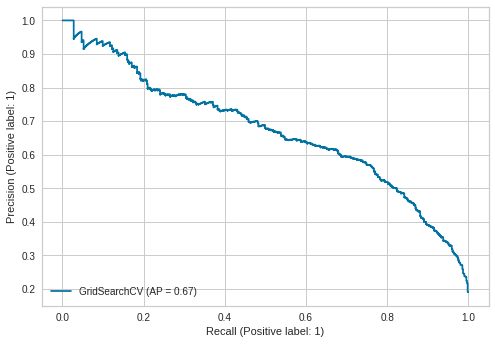

In [237]:
plot_precision_recall_curve(grid_rftf_model, X_test_tf_idf, y_test, pos_label=1)

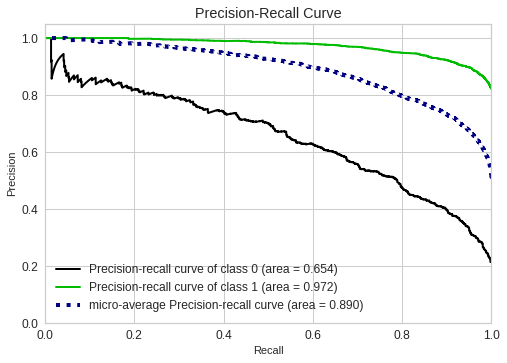

In [ ]:
y_probas = grid_rftf_model.predict_proba(X_test_tf_idf)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [238]:
y_pred = grid_rftf_model.predict(X_test_tf_idf)
rf_tfidf_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
rf_tfidf_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
rf_tfidf_accuracy_neg = accuracy_score(y_test, y_pred)
rf_tfidf_AP_neg = viz.score_

## Ada Boosting

### Countvectorizer

In [248]:
from sklearn.utils import class_weight

classes_weights = class_weight.compute_sample_weight(class_weight='balanced', y=y_train)
classes_weights

array([0.61061048, 0.61061048, 2.76018359, ..., 0.61061048, 0.61061048,
       0.61061048])

In [249]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(n_estimators= 50, random_state = random_state)
ada.fit(X_train_count, y_train, sample_weight=classes_weights)

AdaBoostClassifier(random_state=101)

In [250]:
print("Ada MODEL")
eval(ada, X_train_count, X_test_count)

Ada MODEL
[[2307  475]
 [ 138  477]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.83      0.88      2782
           1       0.50      0.78      0.61       615

    accuracy                           0.82      3397
   macro avg       0.72      0.80      0.75      3397
weighted avg       0.86      0.82      0.83      3397

Train_Set
              precision    recall  f1-score   support

           0       0.95      0.83      0.88     15758
           1       0.50      0.78      0.61      3486

    accuracy                           0.82     19244
   macro avg       0.72      0.81      0.75     19244
weighted avg       0.86      0.82      0.83     19244



In [251]:
model = AdaBoostClassifier(n_estimators= 50, random_state = random_state)
scores = cross_validate(model, X_train_count, y_train, fit_params={"sample_weight":classes_weights}, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,1.044,0.077,0.814,0.818,0.491,0.498,0.780,0.778,0.603,0.607
2,1.024,0.064,0.814,0.820,0.491,0.503,0.750,0.786,0.593,0.613
3,1.064,0.065,0.811,0.822,0.487,0.506,0.783,0.783,0.601,0.615
4,1.019,0.062,0.813,0.822,0.490,0.506,0.769,0.787,0.599,0.616
5,1.032,0.066,0.812,0.820,0.488,0.502,0.755,0.792,0.593,0.615


test_accuracy         0.813
train_accuracy        0.821
test_precision-neg    0.489
train_precision-neg   0.503
test_recall-neg       0.768
train_recall-neg      0.785
test_f1-neg           0.598
train_f1-neg          0.613
dtype: float64

In [252]:
from sklearn.model_selection import GridSearchCV

model = AdaBoostClassifier(random_state = random_state)

param_grid = {
              "n_estimators" : [10, 20, 40, 50],
              "learning_rate":np.linspace(0.01,1,10).round(3)   
          }

grid_ada_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)

In [253]:
%%time
grid_ada_model.fit(X_train_count,y_train,sample_weight=classes_weights)


CPU times: user 2.05 s, sys: 295 ms, total: 2.35 s
Wall time: 1min 59s


GridSearchCV(cv=5, estimator=AdaBoostClassifier(random_state=101), n_jobs=-1,
             param_grid={'learning_rate': array([0.01, 0.12, 0.23, 0.34, 0.45, 0.56, 0.67, 0.78, 0.89, 1.  ]),
                         'n_estimators': [10, 20, 40, 50]},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [254]:
grid_ada_model.best_params_

{'learning_rate': 0.01, 'n_estimators': 10}

In [255]:
grid_ada_model.best_score_

0.9457782637829748

In [256]:
eval(grid_ada_model, X_train_count, X_test_count)  

[[ 474 2308]
 [  34  581]]
Test_Set
              precision    recall  f1-score   support

           0       0.93      0.17      0.29      2782
           1       0.20      0.94      0.33       615

    accuracy                           0.31      3397
   macro avg       0.57      0.56      0.31      3397
weighted avg       0.80      0.31      0.30      3397

Train_Set
              precision    recall  f1-score   support

           0       0.95      0.17      0.29     15758
           1       0.20      0.96      0.34      3486

    accuracy                           0.31     19244
   macro avg       0.58      0.56      0.31     19244
weighted avg       0.81      0.31      0.30     19244



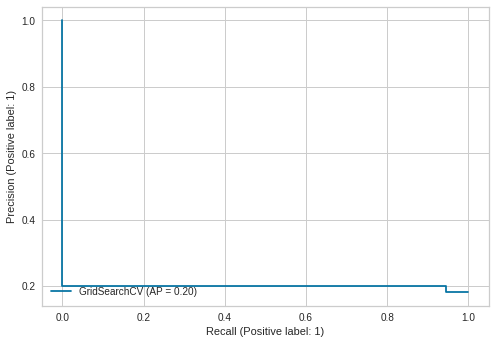

In [257]:
plot_precision_recall_curve(grid_ada_model, X_test_count, y_test, pos_label=1)

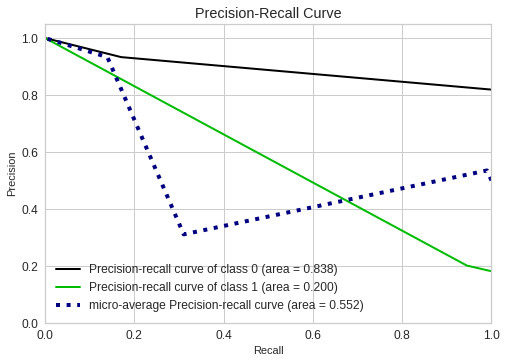

In [258]:
y_probas = grid_ada_model.predict_proba(X_test_count)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [260]:
y_pred = grid_ada_model.predict(X_test_count)
ada_count_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
ada_count_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
ada_count_accuracy_neg = accuracy_score(y_test, y_pred)
ada_count_AP_neg = viz.score_

### TF-IDF

In [261]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(n_estimators= 50, random_state = random_state)
ada.fit(X_train_tf_idf, y_train, sample_weight=classes_weights)

AdaBoostClassifier(random_state=101)

In [262]:
print("Ada MODEL")
eval(ada, X_train_tf_idf, X_test_tf_idf)

Ada MODEL
[[2296  486]
 [ 173  442]]
Test_Set
              precision    recall  f1-score   support

           0       0.93      0.83      0.87      2782
           1       0.48      0.72      0.57       615

    accuracy                           0.81      3397
   macro avg       0.70      0.77      0.72      3397
weighted avg       0.85      0.81      0.82      3397

Train_Set
              precision    recall  f1-score   support

           0       0.94      0.83      0.89     15758
           1       0.51      0.77      0.61      3486

    accuracy                           0.82     19244
   macro avg       0.73      0.80      0.75     19244
weighted avg       0.86      0.82      0.84     19244



In [263]:
model = AdaBoostClassifier(n_estimators= 50, random_state = random_state)
scores = cross_validate(model, X_train_tf_idf, y_train, fit_params={"sample_weight":classes_weights}, scoring = scoring, cv = 5, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 6))
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_precision-neg,train_precision-neg,test_recall-neg,train_recall-neg,test_f1-neg,train_f1-neg
1,4.766,0.063,0.790,0.799,0.454,0.469,0.798,0.825,0.579,0.598
2,2.789,0.060,0.789,0.801,0.452,0.472,0.769,0.817,0.569,0.598
3,4.425,0.141,0.785,0.801,0.447,0.472,0.786,0.828,0.570,0.601
4,4.379,0.086,0.799,0.804,0.468,0.476,0.789,0.821,0.587,0.603
5,4.034,0.101,0.790,0.802,0.453,0.473,0.782,0.827,0.574,0.602


test_accuracy         0.790
train_accuracy        0.801
test_precision-neg    0.455
train_precision-neg   0.472
test_recall-neg       0.785
train_recall-neg      0.824
test_f1-neg           0.576
train_f1-neg          0.600
dtype: float64

In [264]:
from sklearn.model_selection import GridSearchCV

model = AdaBoostClassifier(random_state = random_state)



param_grid = {
              "n_estimators" : [10, 20, 40, 50],
              "learning_rate":np.linspace(0.01,1,10).round(3)   
          }

grid_adatf_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=5,
                          scoring = recall_neg,   
                          n_jobs = -1)


In [265]:
%%time
grid_adatf_model.fit(X_train_tf_idf,y_train,sample_weight=classes_weights)

CPU times: user 3.24 s, sys: 268 ms, total: 3.51 s
Wall time: 4min 50s


GridSearchCV(cv=5, estimator=AdaBoostClassifier(random_state=101), n_jobs=-1,
             param_grid={'learning_rate': array([0.01, 0.12, 0.23, 0.34, 0.45, 0.56, 0.67, 0.78, 0.89, 1.  ]),
                         'n_estimators': [10, 20, 40, 50]},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [266]:
grid_adatf_model.best_params_

{'learning_rate': 0.01, 'n_estimators': 10}

In [267]:
grid_adatf_model.best_score_

0.9690178538394182

In [268]:
eval(grid_adatf_model, X_train_tf_idf, X_test_tf_idf)  

[[ 399 2383]
 [  24  591]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.14      0.25      2782
           1       0.20      0.96      0.33       615

    accuracy                           0.29      3397
   macro avg       0.57      0.55      0.29      3397
weighted avg       0.81      0.29      0.26      3397

Train_Set
              precision    recall  f1-score   support

           0       0.96      0.15      0.26     15758
           1       0.20      0.97      0.33      3486

    accuracy                           0.30     19244
   macro avg       0.58      0.56      0.30     19244
weighted avg       0.82      0.30      0.27     19244



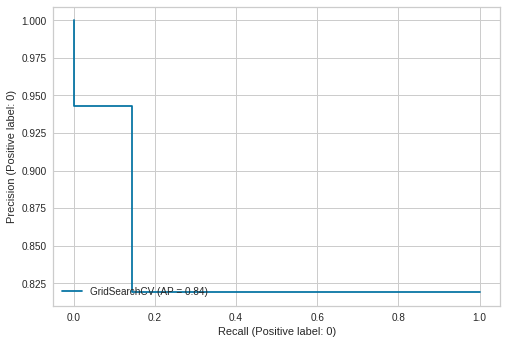

In [269]:
plot_precision_recall_curve(grid_adatf_model, X_test_tf_idf, y_test, pos_label=0)

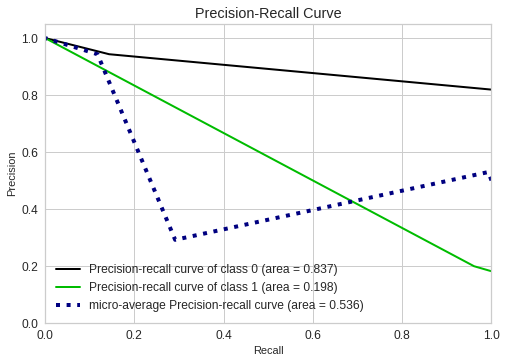

In [270]:
y_probas = grid_adatf_model.predict_proba(X_test_tf_idf)
skplt.metrics.plot_precision_recall(y_test, y_probas)
plt.show()

In [273]:
y_pred = grid_adatf_model.predict(X_test_tf_idf)
ada_tfidf_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
ada_tfidf_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
ada_tfidf_accuracy_neg = accuracy_score(y_test, y_pred)
ada_tfidf_AP_neg = viz.score_

## DL modeling

## Data Preprocessing

In [280]:
df2 =df_org[["Recommended IND","Review Text"]]
df2.rename(columns={"Review Text":"text", "Recommended IND":"label"}, inplace=True)
df2 = df2.dropna().reset_index(drop=True)
df2

,label,text
0,1,Absolutely wonderful - silky and sexy and comf...
1,1,Love this dress! it's sooo pretty. i happene...
2,0,I had such high hopes for this dress and reall...
3,1,"I love, love, love this jumpsuit. it's fun, fl..."
4,1,This shirt is very flattering to all due to th...
...,...,...
22636,1,I was very happy to snag this dress at such a ...
22637,1,"It reminds me of maternity clothes. soft, stre..."
22638,0,"This fit well, but the top was very see throug..."
22639,1,I bought this dress for a wedding i have this ...


In [281]:
df2.label = df2.label.map({1:0, 0:1}) 

In [282]:
df2.label.value_counts(normalize=True)

0   0.819
1   0.181
Name: label, dtype: float64

In [283]:
from tensorflow.keras.models import Sequential  # deep learning modeli kuracağız
from tensorflow.keras.layers import Dense, GRU, Embedding, Dropout  # kullanacağımız layer lar
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.text import Tokenizer  # tokenlaştırma işlemi bu fonk üzerinden yapılacak
from tensorflow.keras.preprocessing.sequence import pad_sequences  # CNN deki padding gibi  0 bileşenlerle kelime vektörlerini (wordembedding) tamamlayacak

### Tokenization

In [284]:
X = df2['text']
y = df2['label']

In [285]:
tokenizer = Tokenizer()  # as we have small dataset we didn't use num_words parameter
tokenizer.fit_on_texts(X)

### Creating word index

In [286]:
print(tokenizer.word_index)
print(tokenizer.index_word)
print(tokenizer.word_counts)

{'the': 1, 'i': 2, 'and': 3, 'a': 4, 'it': 5, 'is': 6, 'this': 7, 'to': 8, 'in': 9, 'but': 10, 'on': 11, 'for': 12, 'of': 13, 'with': 14, 'was': 15, 'so': 16, 'my': 17, 'dress': 18, 'not': 19, 'that': 20, 'love': 21, 'size': 22, 'very': 23, 'have': 24, 'top': 25, 'fit': 26, 'are': 27, 'like': 28, 'be': 29, 'as': 30, 'me': 31, 'wear': 32, "it's": 33, 'great': 34, 'too': 35, "i'm": 36, 'or': 37, 'am': 38, 'just': 39, 'you': 40, 'would': 41, 'they': 42, 'up': 43, 'at': 44, 'fabric': 45, 'small': 46, 'color': 47, 'look': 48, 'if': 49, 'more': 50, 'really': 51, 'ordered': 52, 'little': 53, 'perfect': 54, 'will': 55, 'one': 56, 'these': 57, 'flattering': 58, 'well': 59, 'an': 60, 'soft': 61, 'out': 62, 'back': 63, 'because': 64, 'had': 65, 'can': 66, '\r': 67, 'comfortable': 68, 'cute': 69, 'nice': 70, 'than': 71, 'bought': 72, 'beautiful': 73, 'when': 74, 'all': 75, 'looks': 76, 'bit': 77, 'fits': 78, 'large': 79, 'shirt': 80, 'down': 81, 'which': 82, 'material': 83, 'much': 84, 'them': 85,

In [287]:
len(tokenizer.word_index), len((tokenizer.index_word))

(14847, 14847)

In [288]:
pd.Series(tokenizer.index_word)

1                the
2                  i
3                and
4                  a
5                 it
            ...     
14843        donse't
14844     population
14845    camoflauges
14846        blaring
14847       platinum
Length: 14847, dtype: object

In [289]:
# the frequency of tokens
tokens = pd.Series(tokenizer.word_counts).sort_values(ascending=False)
tokens

the         76164
i           59314
and         49009
a           43017
it          42817
            ...  
yo'self         1
detaches        1
odette          1
oblong          1
platinum        1
Length: 14847, dtype: int64

In [290]:
tokens[tokens > 1]

the             76164
i               59314
and             49009
a               43017
it              42817
                ...  
sundresses          2
levis               2
mysteriously        2
skiers              2
moisture            2
Length: 8501, dtype: int64

In [291]:
num_words = len(tokenizer.index_word) + 1

### Converting tokens to numeric

In [292]:
X_num_tokens = tokenizer.texts_to_sequences(X)
X_num_tokens[:1]

[[253, 532, 917, 3, 662, 3, 68]]

In [293]:
X[100]

"The fabric felt cheap and i didn't find it to be a flattering top. for reference i am wearing a medium in the photos and my measurements are 38-30-40."

In [294]:
print(X_num_tokens[100])

[1, 45, 267, 489, 3, 2, 124, 221, 5, 8, 29, 4, 58, 25, 12, 330, 2, 38, 141, 4, 97, 9, 1, 451, 3, 17, 1506, 27, 920, 691, 927]


In [295]:
print(X[106])
print(X_num_tokens[100])

Perfect dress for hot, humid, sticky weather.
[1, 45, 267, 489, 3, 2, 124, 221, 5, 8, 29, 4, 58, 25, 12, 330, 2, 38, 141, 4, 97, 9, 1, 451, 3, 17, 1506, 27, 920, 691, 927]


### Maximum number of tokens for all documents¶

In [296]:
len(X_num_tokens[100]), len(X[100])

(31, 150)

In [297]:
len(X_num_tokens[200])

38

In [299]:
num_tokens_doc = [len(tokens) for tokens in X_num_tokens]
num_tokens_doc = np.array(num_tokens_doc)

In [ ]:
num_tokens_doc, num_tokens_doc.shape

(array([ 7, 62, 97, ..., 42, 85, 19]), (22641,))

In [300]:
num_tokens_doc.mean()

60.60699615741354

In [301]:
num_tokens_doc.max()

116

In [303]:
num_tokens_doc.argmax()

16263

In [304]:
X[16263]

"I love maeve tops. i love the material and feel of this brand. when i saw the new tops that came out i ran to my local store to try one on. i'm usually a large in a top, once in a while an xl. they only had a large to try so i tried it in the black motif.\ni could barely get the top on. it looked like i was missing 1/2 of the top. i doubled checked the size and it was a large.\nit's a shame, the top is really cute. if you are the least bit broad or busty, go up a size or two. if you are usually a"

### Define max tokens

In [307]:
num_tokens_doc.max()

116

In [314]:
max_tokens = num_tokens_doc.max() + 1

In [315]:
sum(num_tokens_doc < max_tokens) / len(num_tokens_doc)

1.0

In [316]:
sum(num_tokens_doc < max_tokens), len(num_tokens_doc), sum(num_tokens_doc < max_tokens) / len(num_tokens_doc)

(22641, 22641, 1.0)

### Fixing token counts of all documents (pad_sequences)

In [317]:
X_pad = pad_sequences(X_num_tokens, maxlen=max_tokens)

In [318]:
pd.DataFrame(X_pad)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,253,532,917,3,662,3,68
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,7,18,33,1713,99,2,1322,8,221,5,9,4,106,3,36,314,2,131,1243,2,429,41,24,52,5,136,1243,33,95,2,72,4,95,3,38,501,2,21,1,86,11,31,416,39,4,53,454,1,392,41,155,29,4,130,1372,11,438,439,6,772,95
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,65,312,178,1095,12,7,18,3,51,195,5,8,102,12,31,2,1152,52,1,95,46,17,236,22,10,2,219,7,8,29,6689,46,16,46,9,661,20,2,118,19,784,5,43,2,2147,5,9,95,97,82,15,39,637,250,1,25,656,15,68,3,26,258,10,1,175,656,65,4,23,148,272,475,3,527,718,489,4601,151,975,1876,4,1877,142,1589,15,1,4601,151,475,830,3247,313,1,469,5,688
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,21,21,21,7,630,33,283,1302,3,788,316,183,2,32,5,2,115,533,10,34,210
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,80,6,23,58,8,75,486,8,1,1157,156,467,5,6,1,54,86,8,32,14,268,3,5,6,1190,16,5,831,59,14,251,395,21,7,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22636,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,15,23,287,8,992,7,18,44,312,4,34,162,33,23,277,8,376,11,3,89,4,23,58,120,3,47,1156
22637,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,1496,31,13,687,633,61,456,1803,83,120,6,58,3,549,258,2,117,219,56,371,8,699,156,157,773,70,90,135,19,12,31,10,339,12,525,39,637
22638,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7,26,59,10,1,25,15,23,121,203,7,429,41,24,561,12,31,36,314,2,15,427,8,179,5,11,9,1,106,3,124,241,5,136,14,244,45,5,41,24,166,34
22639,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,72,7,18,12,4,592,2,24,7,138,3,33,16,69,302,1,26,373,54,1,97,78,17,94,150,10,15,116,35,90,3,35,119,9,1,208,3,200,49,2,195,8,1498,1,901,2,118,115,5,897,10,2,39,267,28,5,269,19,29,308,5,215,940,7,18,15,2812,8,31,14,4,7580,803,11,5,3,2,219,5,84,2409,129,206,185


In [319]:
X_pad.shape 

(22641, 117)

In [321]:
X_num_tokens[0]

[253, 532, 917, 3, 662, 3, 68]

In [322]:
X_pad[num_tokens_doc.argmax()]

array([   0,    2,   21,  771,  218,    2,   21,    1,   83,    3,  145,
         13,    7,  480,   74,    2,  196,    1,  447,  218,   20,  364,
         62,    2,  516,    8,   17,  494,  106,    8,  179,   56,   11,
         36,  107,    4,   79,    9,    4,   25,  425,    9,    4,  247,
         60,  418,   42,  117,   65,    4,   79,    8,  179,   16,    2,
        104,    5,    9,    1,  123,  791,    2,  118,  778,  115,    1,
         25,   11,    5,  157,   28,    2,   15, 1609,  504,  160,   13,
          1,   25,    2, 4114, 1777,    1,   22,    3,    5,   15,    4,
         79,   33,    4, 1376,    1,   25,    6,   51,   69,   49,   40,
         27,    1,  502,   77,  652,   37,  583,  147,   43,    4,   22,
         37,  262,   49,   40,   27,  107,    4], dtype=int32)

In [323]:
print(X[100])
print(X_num_tokens[100])
X_pad[100]

The fabric felt cheap and i didn't find it to be a flattering top. for reference i am wearing a medium in the photos and my measurements are 38-30-40.
[1, 45, 267, 489, 3, 2, 124, 221, 5, 8, 29, 4, 58, 25, 12, 330, 2, 38, 141, 4, 97, 9, 1, 451, 3, 17, 1506, 27, 920, 691, 927]


array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    1,   45,
        267,  489,    3,    2,  124,  221,    5,    8,   29,    4,   58,
         25,   12,  330,    2,   38,  141,    4,   97,    9,    1,  451,
          3,   17, 1506,   27,  920,  691,  927], dtype=int32)

In [324]:
len(X[100]), len(X_num_tokens[100]), X_pad[100].shape

(150, 31, (117,))

### Train Set Split

In [325]:
from sklearn.model_selection import train_test_split


In [338]:
X_train, X_test, y_train, y_test = train_test_split(X_pad, y, test_size=0.15, stratify=y, random_state=random_state)

### Modeling

In [339]:
num_words, max_tokens

(14848, 117)

In [340]:
embedding_size = 50

model = Sequential()

model.add(Embedding(input_dim=num_words,
                    output_dim=embedding_size,
                    input_length=max_tokens ))

# model.add(Dropout(0.2))

model.add(GRU(units=48, return_sequences=True))
# model.add(Dropout(0.2))

model.add(GRU(units=24, return_sequences=True))
# model.add(Dropout(0.2))

model.add(GRU(units=12))

model.add(Dense(1, activation='sigmoid'))

In [341]:
optimizer = Adam(learning_rate=0.001)  

In [342]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['Recall'])

In [343]:
model.summary() 

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 117, 50)           742400    
                                                                 
 gru_3 (GRU)                 (None, 117, 48)           14400     
                                                                 
 gru_4 (GRU)                 (None, 117, 24)           5328      
                                                                 
 gru_5 (GRU)                 (None, 12)                1368      
                                                                 
 dense_1 (Dense)             (None, 1)                 13        
                                                                 
Total params: 763,509
Trainable params: 763,509
Non-trainable params: 0
_________________________________________________________________


In [344]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor="val_recall", mode="max", 
                           verbose=1, patience = 1, restore_best_weights=True)

In [345]:
from sklearn.utils import class_weight

class_weights = dict(
    zip(np.unique(y_train),
        class_weight.compute_class_weight(
            class_weight = 'balanced',
            classes = np.unique(y_train), 
            y = y_train)
))
class_weights

{0: 0.610610483563904, 1: 2.7601835915088926}

In [346]:
model.fit(X_train, y_train, epochs=10, batch_size=64, sample_weight= classes_weights,
         validation_data=(X_test, y_test), callbacks=[early_stop])

Epoch 1/10
301/301 [==============================] - 16s 22ms/step - loss: 0.4545 - recall: 0.7771 - val_loss: 0.3984 - val_recall: 0.9089
Epoch 2/10
301/301 [==============================] - 6s 19ms/step - loss: 0.2770 - recall: 0.9200 - val_loss: 0.2959 - val_recall: 0.8293
Epoch 2: early stopping


In [349]:
model.save("/content/drive/MyDrive/Colab Notebooks/NLP_Project/modeldl.h5")

## Model evaluation

In [347]:
model_loss = pd.DataFrame(model.history.history)
model_loss.head()

,loss,recall,val_loss,val_recall
0,0.455,0.777,0.398,0.909
1,0.277,0.920,0.296,0.829


<AxesSubplot:>

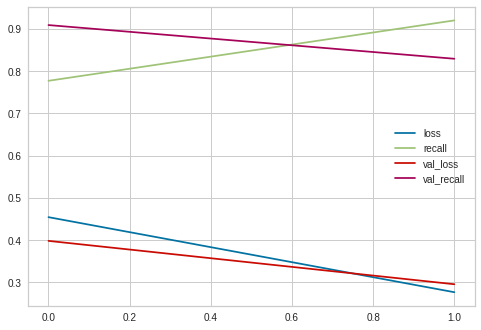

In [348]:
model_loss.plot()

In [350]:
model.evaluate(X_test, y_test)

107/107 [==============================] - 1s 9ms/step - loss: 0.3984 - recall: 0.9089


[0.39841172099113464, 0.9089431166648865]

In [351]:
model.evaluate(X_train, y_train)

602/602 [==============================] - 5s 8ms/step - loss: 0.3445 - recall: 0.9618


[0.3445129096508026, 0.9618473649024963]

In [352]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, roc_auc_score

y_pred = model.predict(X_test) >= 0.5

print(confusion_matrix(y_test, y_pred))
print(50*"-")
print(classification_report(y_test, y_pred))
y_train_pred = model.predict(X_train) >= 0.5
print(50*"#")
print(confusion_matrix(y_train, y_train_pred))
print(50*"-")
print(classification_report(y_train, y_train_pred))

107/107 [==============================] - 2s 7ms/step
[[2260  522]
 [  56  559]]
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.81      0.89      2782
           1       0.52      0.91      0.66       615

    accuracy                           0.83      3397
   macro avg       0.75      0.86      0.77      3397
weighted avg       0.89      0.83      0.85      3397

602/602 [==============================] - 4s 7ms/step
##################################################
[[13056  2702]
 [  133  3353]]
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.83      0.90     15758
           1       0.55      0.96      0.70      3486

    accuracy                           0.85     19244
   macro avg       0.77      0.90      0.80     19244
weighted avg       0.91      0.85      0.87     19244



107/107 [==============================] - 1s 7ms/step


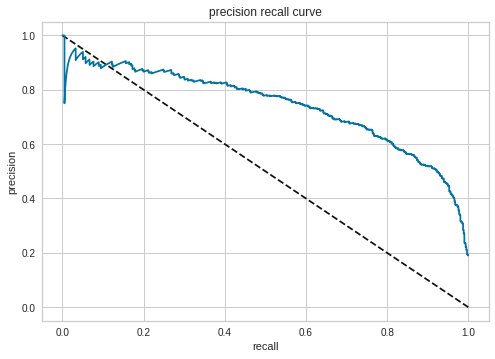

In [353]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

y_pred_proba = model.predict(X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot([1,0],[0,1],'k--')
plt.plot(recall, precision)
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('precision recall curve')
plt.show()

In [354]:
average_precision_score(y_test, y_pred_proba)

0.7407703294966098

107/107 [==============================] - 1s 12ms/step


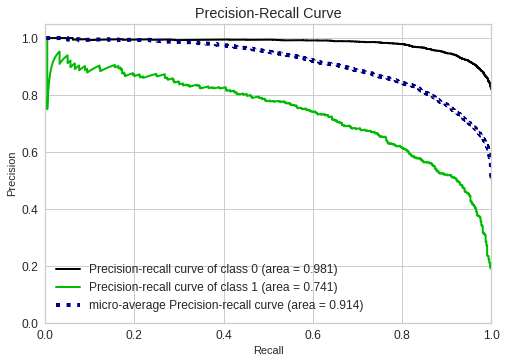

In [358]:
!pip install scikit-plot -q
import scikitplot as skplt

y_pred_proba = model.predict(X_test)
skplt.metrics.plot_precision_recall(y_test, np.hstack([(1-y_pred_proba), y_pred_proba]))
plt.show()

In [360]:
y_pred = model.predict(X_test) >=0.5
gru_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
gru_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
gru_accuracy_neg = accuracy_score(y_test, y_pred)
gru_AP_neg = viz.score_

107/107 [==============================] - 1s 7ms/step


## BERT Modeling

In [370]:
df = pd.DataFrame(df_org[["Recommended IND", "Review Text"]].values, columns=['label', 'text'])
df['label'] = df['label'].map({0 : 1, 1: 0})
df = df.dropna().reset_index(drop=True)
df

,label,text
0,0,Absolutely wonderful - silky and sexy and comf...
1,0,Love this dress! it's sooo pretty. i happene...
2,1,I had such high hopes for this dress and reall...
3,0,"I love, love, love this jumpsuit. it's fun, fl..."
4,0,This shirt is very flattering to all due to th...
...,...,...
22636,0,I was very happy to snag this dress at such a ...
22637,0,"It reminds me of maternity clothes. soft, stre..."
22638,1,"This fit well, but the top was very see throug..."
22639,0,I bought this dress for a wedding i have this ...


In [ ]:
import tensorflow as tf
import os

# Note that the `tpu` argument is for Colab-only
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])

tf.config.experimental_connect_to_cluster(resolver)
tf.tpu.experimental.initialize_tpu_system(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

In [ ]:
strategy = tf.distribute.TPUStrategy(resolver)

In [373]:
!pip install transformers -q

In [374]:
X = df['text'].values  # arrayler daha hızlı olduğu için.
y = df['label'].values

### Train test split

In [375]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=101)

### Tokenization

In [376]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [377]:
# For every sentence...
# Fixing token counts of all documents

max_token = []
for sent in X:

    # Tokenize the text and add `[CLS]` and `[SEP]` tokens.
    
    input_ids = tokenizer.encode(sent, add_special_tokens=True)
    max_token.append(len(input_ids))

print('Max sentence length: ', max(max_token))  # en uzun yorum kaç tokenden oluşuyor

Max sentence length:  162


In [378]:
from scipy import stats 

arr = np.array(max_token)
 
print("Descriptive analysis")
print("Document Size \t=", arr.shape[0])
print("Doc Token Count\t=", arr)

# measures of central tendency
print("Measures of Central Tendency")
print("Mean \t\t=", arr.mean())
print("Median \t\t=", np.median(arr))
print("Mode \t\t=", stats.mode(arr)[0][0])

# measures of dispersion
print("Measures of Dispersion")
print("Minimum \t=", arr.min())
print("Maximum \t=", arr.max())
print("Range \t\t=", arr.ptp())
print("Variance \t=", arr.var())
print("Standard Deviation =", arr.std())

Descriptive analysis
Document Size 	= 22641
Doc Token Count	= [ 10  82 118 ...  54 102  26]
Measures of Central Tendency
Mean 		= 76.75659202332052
Median 		= 75.0
Mode 		= 122
Measures of Dispersion
Minimum 	= 4
Maximum 	= 162
Range 		= 158
Variance 	= 1251.4350770125225
Standard Deviation = 35.37562829141728


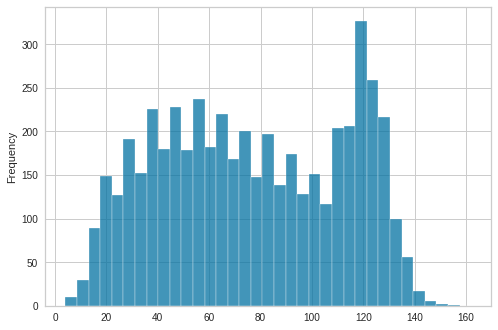

In [379]:
sns.histplot(x=max_token, stat='frequency');

In [380]:
sum(np.array(max_token) < 163) / len(max_token)

1.0

### Transformation text to tensor
#### Transformation Vectors to Matrices

In [381]:
def transformation(X):
  # set array dimensions
  seq_len = 163
  num_samples = len(X)

  # initialize empty zero arrays
  Xids = np.zeros((num_samples, seq_len))
  Xmask = np.zeros((num_samples, seq_len))

    
  for i, phrase in enumerate(X):  # o yorum kaçıncı yoruma denk geliyor.
      tokens = tokenizer.encode_plus(phrase, max_length=seq_len, truncation=True,
                                      padding='max_length', add_special_tokens=True) 
      
      # assign tokenized outputs to respective rows in numpy arrays
      Xids[i] = tokens['input_ids']
      Xmask[i] = tokens['attention_mask']
  return Xids, Xmask

In [382]:
Xids_train, Xmask_train = transformation(X_train)

Xids_test, Xmask_test = transformation(X_test)

In [383]:
print("Xids_train.shape  :", Xids_train.shape)
print("Xmask_train.shape :", Xmask_train.shape)
print("Xids_test.shape   :", Xids_test.shape)
print("Xmask_test.shape  :", Xmask_test.shape)

Xids_train.shape  : (20376, 163)
Xmask_train.shape : (20376, 163)
Xids_test.shape   : (2265, 163)
Xmask_test.shape  : (2265, 163)


In [384]:
labels_train = y_train.reshape(-1,1)
labels_test = y_test.reshape(-1,1)
labels_train.shape, labels_test.shape

((20376, 1), (2265, 1))

#### Transformation Matrix to Tensor

In [385]:
import tensorflow as tf

dataset_train = tf.data.Dataset.from_tensor_slices((Xids_train, Xmask_train, labels_train))
dataset_test = tf.data.Dataset.from_tensor_slices((Xids_test, Xmask_test, labels_test))
dataset_train, dataset_test

(<TensorSliceDataset element_spec=(TensorSpec(shape=(163,), dtype=tf.float64, name=None), TensorSpec(shape=(163,), dtype=tf.float64, name=None), TensorSpec(shape=(1,), dtype=tf.int64, name=None))>,
 <TensorSliceDataset element_spec=(TensorSpec(shape=(163,), dtype=tf.float64, name=None), TensorSpec(shape=(163,), dtype=tf.float64, name=None), TensorSpec(shape=(1,), dtype=tf.int64, name=None))>)

In [386]:
def map_func(Xids, Xmask, labels):
    # we convert our three-item tuple into a two-item tuple where the input item is a dictionary
    return {'input_ids': Xids, 'attention_mask': Xmask}, labels

In [387]:
# then we use the dataset map method to apply this transformation
dataset_train = dataset_train.map(map_func)
dataset_test = dataset_test.map(map_func)

In [388]:
dataset_train,dataset_test

(<MapDataset element_spec=({'input_ids': TensorSpec(shape=(163,), dtype=tf.float64, name=None), 'attention_mask': TensorSpec(shape=(163,), dtype=tf.float64, name=None)}, TensorSpec(shape=(1,), dtype=tf.int64, name=None))>,
 <MapDataset element_spec=({'input_ids': TensorSpec(shape=(163,), dtype=tf.float64, name=None), 'attention_mask': TensorSpec(shape=(163,), dtype=tf.float64, name=None)}, TensorSpec(shape=(1,), dtype=tf.int64, name=None))>)

### Batch Size

In [389]:
batch_size = 32
train_ds = dataset_train.batch(batch_size) 
val_ds = dataset_test.batch(batch_size)

length = len(X_train)
train_ds2 = dataset_train.shuffle(buffer_size = length, reshuffle_each_iteration=True).batch(batch_size)

### Creating Model

In [390]:
def create_model():
    from transformers import TFAutoModel  
    model = TFAutoModel.from_pretrained("bert-base-uncased")
    input_ids = tf.keras.layers.Input(shape=(163,), name='input_ids', dtype='int32')   
    attention_mask = tf.keras.layers.Input(shape=(163,), name='attention_mask', dtype='int32')

    embeddings = model.bert(input_ids=input_ids, attention_mask=attention_mask)["pooler_output"] 
    
    x = tf.keras.layers.Dense(163, activation='relu')(embeddings)  
    x = tf.keras.layers.Dropout(0.1, name="dropout")(x)  
    y = tf.keras.layers.Dense(1, activation='sigmoid', name='outputs')(x)  
    return tf.keras.Model(inputs=[input_ids, attention_mask], outputs=y)

In [ ]:
with strategy.scope():
  
  optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5) 
  loss = tf.keras.losses.BinaryCrossentropy()
  recall = tf.keras.metrics.Recall()
  model3 = create_model()
  model3.compile(optimizer=optimizer, loss=loss, metrics=[recall])  # monitor etmek için metrics =["Recall"]
 

In [ ]:
model3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_ids (InputLayer)         [(None, 163)]        0           []                               
                                                                                                  
 attention_mask (InputLayer)    [(None, 163)]        0           []                               
                                                                                                  
 bert (TFBertMainLayer)         TFBaseModelOutputWi  109482240   ['input_ids[0][0]',              
                                thPoolingAndCrossAt               'attention_mask[0][0]']         
                                tentions(last_hidde                                               
                                n_state=(None, 163,                                         

In [ ]:
history = model3.fit(
    train_ds2, validation_data= val_ds, class_weight= {0:1, 1:4}, epochs=1) 

637/637 [==============================] - 228s 198ms/step - loss: 0.4678 - recall_3: 0.8962 - val_loss: 0.2510 - val_recall_3: 0.9049


In [ ]:
model3.save("/content/drive/MyDrive/Colab Notebooks/NLP_Project/modelbert.h5")

### Model evaluation

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model3.predict(val_ds) >= 0.5
print(classification_report(y_test, y_pred))
print(50*"*")
y_train_pred = model3.predict(train_ds) >= 0.5
print(classification_report(y_train, y_train_pred)) 

71/71 [==============================] - 19s 105ms/step
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      1855
           1       0.68      0.90      0.78       410

    accuracy                           0.91      2265
   macro avg       0.83      0.90      0.86      2265
weighted avg       0.92      0.91      0.91      2265

**************************************************
637/637 [==============================] - 25s 37ms/step
              precision    recall  f1-score   support

           0       0.99      0.92      0.95     16685
           1       0.72      0.96      0.82      3691

    accuracy                           0.93     20376
   macro avg       0.86      0.94      0.89     20376
weighted avg       0.94      0.93      0.93     20376



71/71 [==============================] - 3s 31ms/step


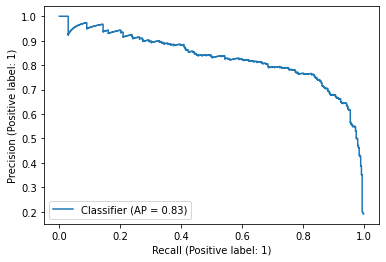

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay
import matplotlib.pyplot as plt

y_pred_proba = model3.predict(val_ds)

PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba)
plt.show();

71/71 [==============================] - 5s 39ms/step


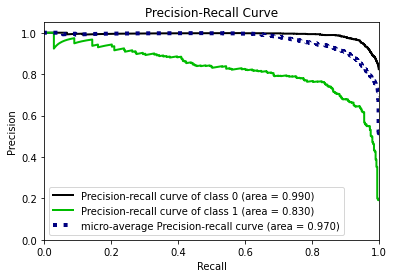

In [ ]:
!pip install scikit-plot -q
import scikitplot as skplt

y_pred_proba = model3.predict(val_ds)
skplt.metrics.plot_precision_recall(y_test, np.hstack([(1-y_pred_proba), y_pred_proba]))
plt.show()

In [ ]:
history

In [ ]:
pd.DataFrame(history.history)

,loss,recall_3,val_loss,val_recall_3
0,0.467831,0.896234,0.250991,0.904878


In [392]:
from tensorflow.keras.models import load_model
model_review = load_model(("/content/drive/MyDrive/Colab Notebooks/NLP_Project/modelbert.h5"), custom_objects={'CustomModel': create_model()})

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [394]:
y_pred = model_review.predict(val_ds) >=0.5
bert_rec_neg = recall_score(y_test, y_pred, labels = [1], average = None)
bert_f1_neg = f1_score(y_test, y_pred, labels = [1], average = None)
bert_accuracy_neg = accuracy_score(y_test, y_pred)
bert_AP_neg = viz.score_

71/71 [==============================] - 33s 378ms/step


### Compare Models F1 Scores, Recall Scores and Average Precision Score

In [423]:
compare = pd.DataFrame({"Model": ["NaiveBayes_count", "LogReg_count", "SVM_count",  "Random Forest_count", 
                                  "AdaBoost_count", "NaiveBayes_tfidf", "LogReg_tfidf", "SVM_tfidf",  
                                  "Random Forest_tfidf", "AdaBoost_tfidf", "GRU_model", "BERT"],
                         "Accuracy_Score": [nb_count_accuracy_neg, log_count_accuracy_neg, svc_count_accuracy_neg,
                                             rf_count_accuracy_neg, ada_count_accuracy_neg, nb_tfidf_accuracy_neg, log_tfidf_accuracy_neg,
                                             svc_tfidf_accuracy_neg, rf_tfidf_accuracy_neg,ada_tfidf_accuracy_neg, gru_accuracy_neg,
                                             bert_accuracy_neg
                                              ],
                        
                        "F1_Score_Negative": [nb_count_f1_neg[0], log_count_f1_neg[0], svc_count_f1_neg[0],
                                             rf_count_f1_neg[0], ada_count_f1_neg[0], nb_tfidf_f1_neg[0], log_tfidf_f1_neg[0],
                                             svc_tfidf_f1_neg[0], rf_tfidf_f1_neg[0],ada_tfidf_f1_neg[0], gru_f1_neg[0],bert_f1_neg[0]
                                              ], 
                        
                        "Recall_Score_Negative": [nb_count_rec_neg[0], log_count_rec_neg[0], svc_count_rec_neg[0], 
                                                  rf_count_rec_neg[0], ada_count_rec_neg[0], 
                                                  nb_tfidf_rec_neg[0], log_tfidf_rec_neg[0], svc_tfidf_rec_neg[0], 
                                                  rf_tfidf_rec_neg[0], ada_tfidf_rec_neg[0],gru_rec_neg[0],bert_rec_neg[0]
                                                  ],
                        
                        "Average_Precision_Score_Negative": [nb_count_AP_neg, log_count_AP_neg, svc_count_AP_neg,  rf_count_AP_neg,
                                                          ada_count_AP_neg, nb_tfidf_AP_neg, log_tfidf_AP_neg, svc_tfidf_AP_neg,
                                                          rf_tfidf_AP_neg, ada_tfidf_AP_neg,gru_AP_neg,bert_AP_neg
                                                          ]
                        })
compare

,Model,Accuracy_Score,F1_Score_Negative,Recall_Score_Negative,Average_Precision_Score_Negative
0,NaiveBayes_count,0.853,0.682,0.872,0.734
1,LogReg_count,0.853,0.677,0.852,0.735
2,SVM_count,0.856,0.687,0.872,0.757
3,Random Forest_count,0.820,0.628,0.839,0.681
4,AdaBoost_count,0.311,0.332,0.945,0.681
5,NaiveBayes_tfidf,0.853,0.682,0.872,0.734
6,LogReg_tfidf,0.850,0.656,0.793,0.688
7,SVM_tfidf,0.856,0.687,0.872,0.757
8,Random Forest_tfidf,0.811,0.615,0.834,0.681
9,AdaBoost_tfidf,0.291,0.329,0.961,0.681


In [424]:
compare.to_csv('/content/drive/MyDrive/Colab Notebooks/NLP_Project/sentiment_analysis_compare.csv', index=False)

In [425]:
compare = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/NLP_Project/sentiment_analysis_compare.csv')
compare

,Model,Accuracy_Score,F1_Score_Negative,Recall_Score_Negative,Average_Precision_Score_Negative
0,NaiveBayes_count,0.853,0.682,0.872,0.734
1,LogReg_count,0.853,0.677,0.852,0.735
2,SVM_count,0.856,0.687,0.872,0.757
3,Random Forest_count,0.820,0.628,0.839,0.681
4,AdaBoost_count,0.311,0.332,0.945,0.681
5,NaiveBayes_tfidf,0.853,0.682,0.872,0.734
6,LogReg_tfidf,0.850,0.656,0.793,0.688
7,SVM_tfidf,0.856,0.687,0.872,0.757
8,Random Forest_tfidf,0.811,0.615,0.834,0.681
9,AdaBoost_tfidf,0.291,0.329,0.961,0.681


### Conclusion

In [426]:
compare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 5 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Model                             12 non-null     object 
 1   Accuracy_Score                    12 non-null     float64
 2   F1_Score_Negative                 12 non-null     float64
 3   Recall_Score_Negative             12 non-null     float64
 4   Average_Precision_Score_Negative  12 non-null     float64
dtypes: float64(4), object(1)
memory usage: 608.0+ bytes


## Accuracy Comparison

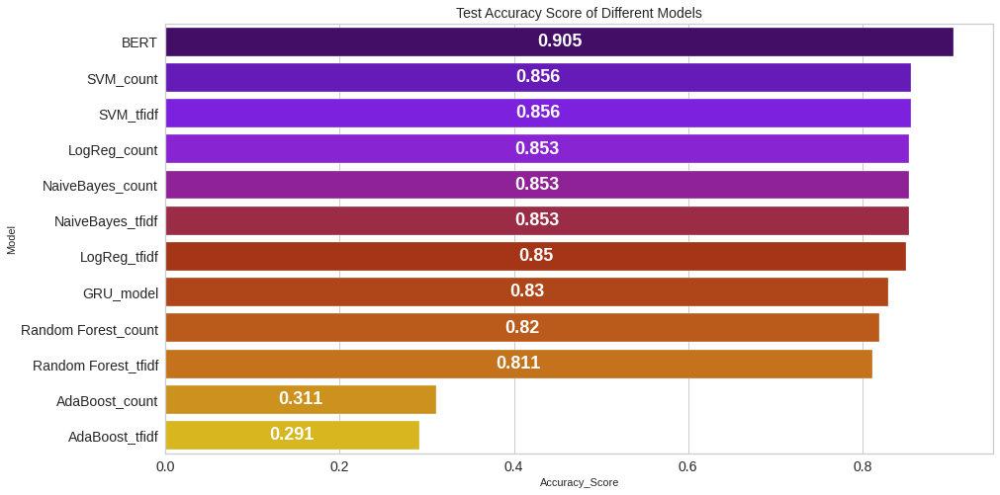

In [427]:
compare = compare.sort_values(by='Accuracy_Score', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='Accuracy_Score', y="Model", data=compare.round(3), palette="gnuplot")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Accuracy Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

> When the models we obtained are evaluated over the accuracy score, the BERT model has the highest value. While the SVM, Logistic Regression and Naive Bayes scores are very close to each other and around 0.85, that of the GRU model is approximately 0.83. When we look at the scores in general, the results of count vectorizer in this dataset gave better results than TFIDF vectorizer. AdaBoost model gives the lowest result in this dataset.

## Recall Score Comparison

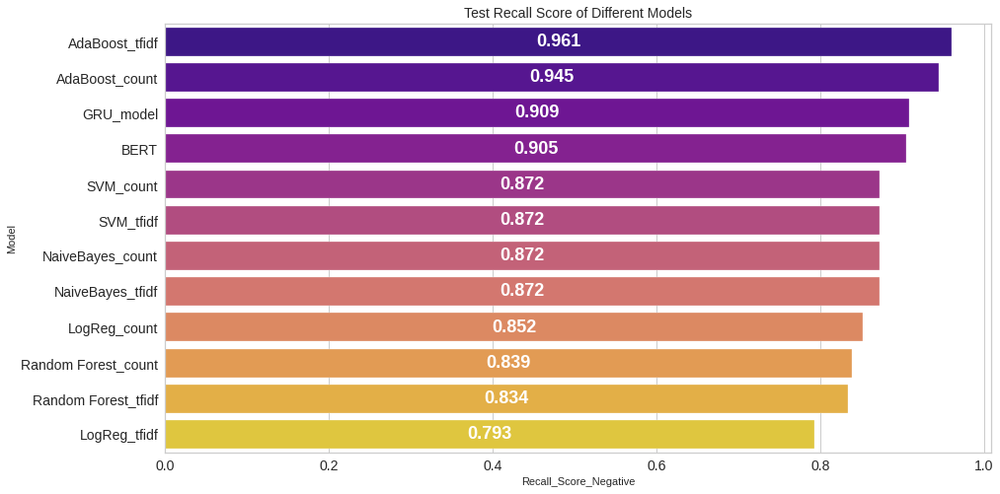

In [429]:
compare = compare.sort_values(by='Recall_Score_Negative', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x="Recall_Score_Negative"	, y="Model", data=compare.round(3), palette="plasma")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Recall Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

> When we evaluate our models based on our target metric, Recall, we see that the AdaBoost model has the highest score. The GRU and Bert models have approximate results and the value is around 0.90. The results of the SVM and Naive Bayes models are almost the same, around 0.87. Random Forest is around 0.81 to 0.84 in both accuracy and recall.

## F1 Score Comparison

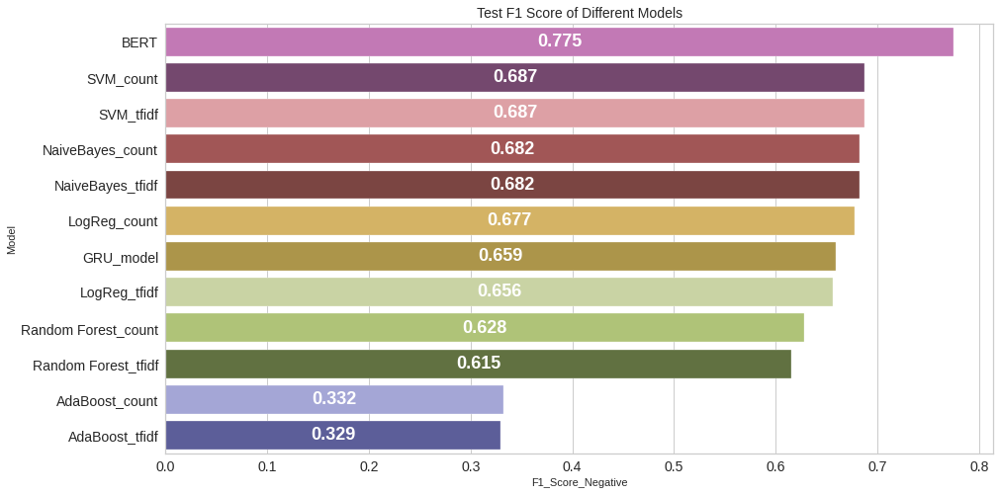

In [438]:
compare = compare.sort_values(by='F1_Score_Negative', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='F1_Score_Negative', y="Model", data=compare.round(3), palette="tab20b_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test F1 Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

> f1 is the harmonic average of the score recall and precision scores. Among our models, the best f1-score belongs to Bert model, which shows that Bert model has higher precision than other models. In cases where both precision and recall values are important, it is more advantageous to use the Bert model for this dataset compared to other models. The lowest scores over the f1 score are that of the AdaBoost model. The results of other models are in the range (0.5, 0.6).

## AP Score Comparison

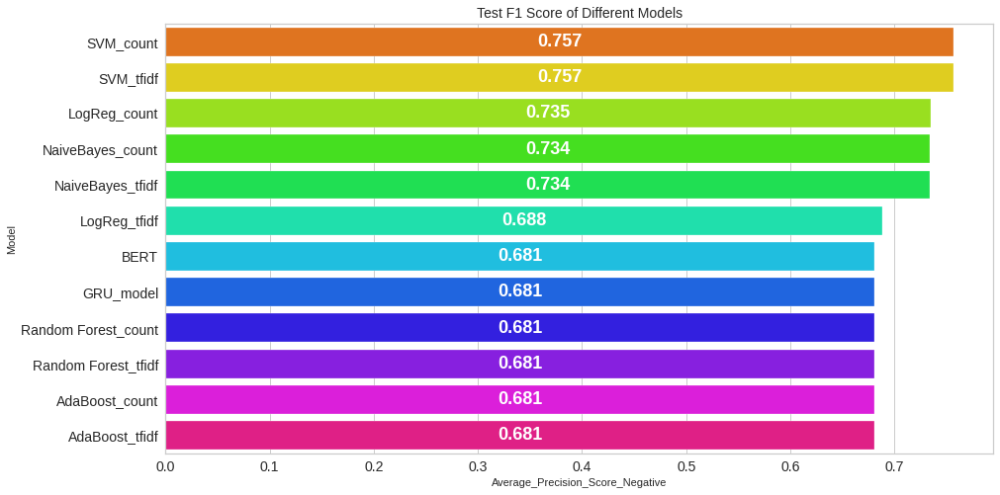

In [435]:
compare = compare.sort_values(by='Average_Precision_Score_Negative', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='Average_Precision_Score_Negative', y="Model", data=compare.round(3), palette='hsv')
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("AP Scoresof Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

The precision-recall curve is used for evaluating the performance of binary classification algorithms. It is often used in situations where classes are heavily imbalanced. Also precision-recall curves provide a graphical representation of a classifier’s performance across many thresholds, rather than a single value (e.g., accuracy, f-1 score, etc.).
The precision-recall curve is constructed by calculating and plotting the precision against the recall for a single classifier at a variety of thresholds. We can summarize the information in a precision-recall curve with a single value. This summary metric is the AUC-PR. AUC-PR stands for area under the (precision-recall) curve. Generally, the higher the AUC-PR score, the better a classifier performs for the given task.One way to calculate AUC-PR is to find the AP, or average precision. The documentation for sklearn.metrics.average_precision_score states, “AP summarizes a precision-recall curve as the weighted mean of precision achieved at each threshold, with the increase in recall from the previous threshold used as the weight.” So, we can think of AP as a kind of weighted-average precision across all thresholds. (by https://medium.com/@douglaspsteen/precision-recall-curves-d32e5b290248). 
> According to different thresholds, the model with the highest weight averages of precision is SVM, Logistic Regression and Naive Bayes, respectively. The other 4 models give a value of approximately 0.68.